# 04 Riluzole Relationships Between FDG and Plasma Biomarkers

In [1]:
# install required packages - commented out so it doesn't install every time
#%conda install -n Lauren openpyxl numpy pandas statsmodels plotnine matplotlib scikit-learn scipy mizani nbconvert pandoc pyreadstat kmodes seaborn

# import required packages
import numpy as np;
import pandas as pd;
from sklearn import preprocessing 
import statsmodels as sm;
import statsmodels.formula.api as smf;
import plotnine as p9;
import itertools
import pickle

import scipy; # for spearmann correlation



In [2]:
sm.__version__

'0.14.0'

# read in and clean data

In [3]:
data_folder_loc = '//admsyn/Primary/ADM/CustomerStudies/Rockefeller/Riluzole_Biomarkers/'
code_folder_loc = '//admsyn/homes/@DH-ADMDX/0/lauren.koenig-1606/code/Riluzole FDG/'

In [4]:
# read in data
composite_rr, pons_rr, para_rr, new_para_rr, ras_rr = pd.read_pickle(code_folder_loc + '/output/01_newdata.pkl')

In [5]:
all_data = ras_rr #[~new_para_rr['ID_ADM'].isin(['APE-792_23', 'APE-792_35', 'APE-792_39', 'APE-792_65', 'APE-792_71', 'RIL_17', 'RIL_21', 'RIL_24', 'APE-792_9','APE-792_22', 'RIL_13'])].copy()#
data_name = 'ras_rr'

In [6]:
# orig has additional 
# 
# pons (1st) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'FRONTAL-gm', 'Avg_MedOrbFrontal', 'Avg PCC'
# para (1st) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'FRONTAL-gm', 'Avg_MedOrbFrontal'

# para (new) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'Avg PCC', 'Avg_MedOrbFrontal'
# para (new) also has 'SensMot-gm', 'Paracentral-gm', 'RASref1-gm'

# ras (new) is missing 'L_Hip', 'R_Hip', 'Avg_Hip', 'Temp', 'Avg_MedOrbFrontal'
# ras (new) also has 'SensMot-gm', 'Paracentral-gm', 'RASref1-gm', 'CO', 'Graycer-gm', 'Vermis-gm'

In [7]:
# define biomarker groups
FDG_columns = ['Avg_MedOrbFrontal', 'Graycer_gm', 'Avg_PCC', 'Avg_Hip', 'MTL_gm', 'CO', 'Temp', 'SensMot_gm', 'L_Hip',
 'Vermis_gm', 'FRONTAL_gm', 'AC_gm', 'Precun_gm', 'Par_gm', 'RASref1_gm', 'Temp_gm', 'Paracentral_gm', 'R_Hip', 'PostCing_gm']

plasma_columns = [ 'Ab40', 'Ab42', 'Ab42_40', 'GFAP','NFL',  'pTau181', 'pTau217',  'pTau231', 'pTau181_Ab42']
log10_plasma_columns = [s + '_log10' for s in plasma_columns]

cog_columns = ['MMSE', 'adascogtotal', 'bvrt', 'dstotal','tma','tmb',  'cowattotal', 'cdrtotal', 'cdrsum', 'adltotal', 'npitotal', 'gds']
vol_columns = ['VOL_Ventricles_Lz',
       'VOL_Ventricles_Rz', 'VOL_Putamen_Lz', 'VOL_Putamen_Rz',
       'VOL_ParaHip_Lz', 'VOL_ParaHip_Rz', 'VOL_Fusi_Lz', 'VOL_Fusi_Rz',
       'VOL_InfTemp_Lz', 'VOL_InfTemp_Rz', 'VOL_MidTemp_Lz', 'VOL_MidTemp_Rz',
       'VOL_SupTemp_Lz', 'VOL_SupTemp_Rz', 'VOL_Precun_Lz', 'VOL_Precun_Rz',
       'VOL_InfPar_Lz', 'VOL_InfPar_Rz', 'VOL_ParaPostCentr_Lz',
       'VOL_ParaPostCentr_Rz', 'VOL_SupraMarg_Lz', 'VOL_SupraMarg_Rz',
       'VOL_SupPar_Lz', 'VOL_SupPar_Rz', 'VOL_OrbitFront_Lz',
       'VOL_OrbitFront_Rz', 'VOL_Insula_Lz', 'VOL_Insula_Rz',
       'VOL_InfFront_Lz', 'VOL_InfFront_Rz', 'VOL_MidFront_Lz',
       'VOL_MidFront_Rz', 'VOL_SupFront_Lz', 'VOL_SupFront_Rz',
       'VOL_PrecFront_Lz', 'VOL_PrecFront_Rz', 'VOL_LatOcc_Lz',
       'VOL_LatOcc_Rz', 'VOL_Lingual_Lz', 'VOL_Lingual_Rz', 'VOL_Cuneus_Lz',
       'VOL_Cuneus_Rz', 'VOL_Pericalc_Lz', 'VOL_Pericalc_Rz',
       'VOL_AntCingulate_Lz', 'VOL_AntCingulate_Rz', 'VOL_PostCingulate_Lz',
       'VOL_PostCingulate_Rz', 'VOL_Entorhinal_Lz', 'VOL_Entorhinal_Rz',
       'VOL_Hip_Lz', 'VOL_Hip_Rz', 'VOL_TotalGrayz', 'VOL_TotalGray_Lz',
       'VOL_TotalGray_Rz', 'VOL_LatTemp_Lz', 'VOL_LatTemp_Rz',
       'VOL_Parietal_Lz', 'VOL_Parietal_Rz', 'VOL_Frontal_Lz',
       'VOL_Frontal_Rz', 'VOL_InfMidTemp_Lz', 'VOL_InfMidTemp_Rz',
       'VOL_InfInsFrontal_Lz', 'VOL_InfInsFrontal_Rz', 'VOL_MidSupFrontal_Lz',
       'VOL_MidSupFrontal_Rz', 'VOL_Inf_Mid_Fus_Temp_Lz',
       'VOL_Inf_Mid_Fus_Temp_Rz', 'VOL_Precun_InfPar_Lz',
       'VOL_Precun_InfPar_Rz', 'VOL_Precun_InfPar_Supramarg_Lz',
       'VOL_Precun_InfPar_Supramarg_Rz', 'VOL_LatOccLingCun_Lz',
       'VOL_LatOccLingCun_Rz', 'VOL_InfParSupra_Lz', 'VOL_InfParSupra_Rz']

In [8]:
print('any missing covariate data?')
all_data[all_data['timepoint'].isin(['base'])].dropna(subset = [ele for ele in FDG_columns if ele in all_data.columns], how = 'all')[['age', 'Education_years', 'sex', 'apoe4_carrier', 'race']].isna().value_counts().sort_index()

any missing covariate data?


age    Education_years  sex    apoe4_carrier  race 
False  False            False  False          False    40
                               True           False     1
                                              True      6
True   True             True   True           True      1
Name: count, dtype: int64

# age correct

In [9]:
# regress out age for the plasma vars
all_data_AgeCorrect = all_data.copy()
for var in plasma_columns + log10_plasma_columns:
    Reg = smf.ols(formula = var + '~ age', data = all_data[all_data['source'].isin(['Control']) & all_data['Subject_Label'].isin(['AANDS', 'ADRC'])]).fit()
    all_data_AgeCorrect.loc[:, var] =  all_data_AgeCorrect[var] - Reg.params['age']*(all_data_AgeCorrect['age'] - all_data_AgeCorrect['age'].mean()) 

## make data subsets

In [10]:
# make data subsets
# baseline and non-trial data
baseline_data = all_data[all_data['timepoint'].isin(['base', 'not part of trial'])]

# baseline only
baseline_trial_data = all_data[all_data['timepoint'].isin(['base'])]

# baseline only and only age 70-80
baseline_trial_data_70_80 = baseline_trial_data[(baseline_trial_data['age']<=80) & (baseline_trial_data['age']>=70)]

# Analyses

# Correlations and Linear Modeling

## version using raw plasma data

In [11]:
biomarker_relationship_results_raw = pd.DataFrame(columns = ['var1', 'var2', 
'cor_p_baseline', 'cor_r_baseline', 'cor_n', 
'mv_age_p_baseline', 'mv_age_B_baseline',  'mv_age_n',
'mv_ageedu_p_baseline', 'mv_ageedu_B_baseline',  'mv_ageedu_n',
'mv_aeasr_p_baseline', 'mv_aeasr_B_baseline',  'mv_aeasr_n'])

selected_p_column = ['mv_age_p_baseline']
all_p_columns = ['cor_p_baseline', 'mv_age_p_baseline', 'mv_ageedu_p_baseline', 'mv_aeasr_p_baseline']




for varlist in [ [ele for ele in FDG_columns if ele in all_data.columns], plasma_columns, cog_columns, vol_columns]:
    temp_results = pd.DataFrame(columns = ['var1', 'var2', 
'cor_p_baseline', 'cor_r_baseline', 'cor_n', 
'mv_age_p_baseline', 'mv_age_B_baseline',  'mv_age_n',
'mv_ageedu_p_baseline', 'mv_ageedu_B_baseline',  'mv_ageedu_n',
'mv_aeasr_p_baseline', 'mv_aeasr_B_baseline',  'mv_aeasr_n'])

    combinations = pd.DataFrame(list(itertools.product(plasma_columns, varlist)))

    for idx in range(combinations[0].size):
        var0 = combinations[0][idx]
        var1 = combinations[1][idx]
        
        temp_df_baseline =  baseline_trial_data.copy().dropna(subset = [var0, var1])

        # z-score data
        temp_df_baseline[[var0, var1, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var0, var1, 'Education_years', 'age']])

        # basic correlation
        cor_r_baseline, cor_p_baseline = scipy.stats.spearmanr(temp_df_baseline[var0], temp_df_baseline[var1])
        cor_n = len(temp_df_baseline)

        # multivariate linear model with age as covariate
        model = smf.ols(formula = var0 + ' ~ age + ' + var1 , data = temp_df_baseline).fit()
        mv_age_p_baseline = model.pvalues[var1]
        mv_age_B_baseline = model.params[var1]
        mv_age_n = len(temp_df_baseline.dropna(subset = ['age']))

        # multivariate linear model with age and education years as covariates
        model = smf.ols(formula = var0 + ' ~ age + Education_years + ' + var1 , data = temp_df_baseline).fit()
        mv_ageedu_p_baseline = model.pvalues[var1]
        mv_ageedu_B_baseline = model.params[var1]
        mv_ageedu_n = len(temp_df_baseline.dropna(subset = ['age', 'Education_years']))

        # multivariate linear model with age and education years as covariates
        model = smf.ols(formula = var0 + ' ~ age + apoe4_carrier + sex + Education_years + race + ' + var1 , data = temp_df_baseline).fit()
        mv_aeasr_p_baseline = model.pvalues[var1]
        mv_aeasr_B_baseline = model.params[var1]
        mv_aeasr_n = len(temp_df_baseline.dropna(subset = ['age', 'Education_years', 'apoe4_carrier', 'sex', 'race']))
           
        # save results
        temp_results.loc[len(temp_results)] =  [var0, var1, 
        cor_p_baseline, cor_r_baseline, cor_n,
        mv_age_p_baseline, mv_age_B_baseline, mv_age_n,
        mv_ageedu_p_baseline, mv_ageedu_B_baseline, mv_ageedu_n,
        mv_aeasr_p_baseline, mv_aeasr_B_baseline, mv_aeasr_n
        ]

    # remove self-correlations
    temp_results = temp_results[~(temp_results['var1'] == temp_results['var2'])]

    biomarker_relationship_results_raw = pd.concat([biomarker_relationship_results_raw, temp_results])

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not

In [12]:
# set multiple comparisons correction type
mc = 'fdr_bh' #options are bonferroni, sidak, holm-sidak, holm, simes-hochberg, hommel, fdr_bh, fdr_by, fdr_tsbh, fdr_tsbky

# apply multiple comparisons correction separately for each plasma biomarker
#for var in biomarker_relationship_results_raw['var1'].drop_duplicates().to_list():
#    biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['var1'].isin([var]), all_p_columns] = biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['var1'].isin([var]), all_p_columns].apply(lambda x: sm.stats.multitest.multipletests(x.replace({np.nan:1}), method=mc)[1])


In [13]:
biomarker_relationship_results_raw['type'] = 'other'
biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['var2'].isin( [ele for ele in FDG_columns if ele in all_data.columns]), 'type'] = 'FDG PET'
biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['var2'].isin(plasma_columns + log10_plasma_columns), 'type'] = 'Plasma'
biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['var2'].isin(cog_columns), 'type'] = 'Cognitive'
biomarker_relationship_results_raw.loc[biomarker_relationship_results_raw['var2'].isin(vol_columns), 'type'] = 'Volumetric'

In [14]:
biomarker_relationship_results_raw

,var1,var2,cor_p_baseline,cor_r_baseline,cor_n,mv_age_p_baseline,mv_age_B_baseline,mv_age_n,mv_ageedu_p_baseline,mv_ageedu_B_baseline,mv_ageedu_n,mv_aeasr_p_baseline,mv_aeasr_B_baseline,mv_aeasr_n,type
0,Ab40,Graycer_gm,0.752879,0.055182,35,0.900961,0.021877,35,0.964064,0.008026,35,0.764973,0.058831,34,FDG PET
1,Ab40,Avg_PCC,0.776074,0.049860,35,0.824184,0.040395,35,0.909081,0.021151,35,0.954631,-0.011596,34,FDG PET
2,Ab40,MTL_gm,0.223522,-0.196811,40,0.420566,-0.135573,39,0.316599,-0.170402,39,0.849967,-0.041660,34,FDG PET
3,Ab40,CO,0.689350,0.070028,35,0.444253,0.135337,35,0.472682,0.128242,35,0.368432,0.176899,34,FDG PET
4,Ab40,SensMot_gm,0.160693,0.226079,40,0.850397,0.032785,39,0.585363,0.099612,39,0.072156,0.455436,34,FDG PET
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
688,pTau181_Ab42,VOL_Precun_InfPar_Supramarg_Rz,0.511106,0.124805,30,0.222345,0.235509,30,0.012116,0.456797,30,0.018196,0.537535,25,Volumetric
689,pTau181_Ab42,VOL_LatOccLingCun_Lz,0.203086,0.239155,30,0.052737,0.348316,30,0.020757,0.376827,30,0.008180,0.511495,25,Volumetric
690,pTau181_Ab42,VOL_LatOccLingCun_Rz,0.117861,0.291657,30,0.063195,0.335286,30,0.009492,0.423611,30,0.018585,0.467189,25,Volumetric
691,pTau181_Ab42,VOL_InfParSupra_Lz,0.556047,0.111902,30,0.288335,0.221370,30,0.120969,0.296706,30,0.086230,0.392402,25,Volumetric


## version using log10 plasma data

In [15]:
biomarker_relationship_results_log10 = pd.DataFrame(columns = ['var1', 'var2', 
'cor_p_baseline', 'cor_r_baseline', 'cor_n', 
'mv_age_p_baseline', 'mv_age_B_baseline',  'mv_age_n',
'mv_ageedu_p_baseline', 'mv_ageedu_B_baseline',  'mv_ageedu_n',
'mv_aeasr_p_baseline', 'mv_aeasr_B_baseline',  'mv_aeasr_n'])

selected_p_column = ['mv_age_p_baseline']
all_p_columns = ['mv_age_p_baseline', 'mv_ageedu_p_baseline']


for varlist in [ [ele for ele in FDG_columns if ele in all_data.columns], log10_plasma_columns, cog_columns, vol_columns]:
    temp_results = pd.DataFrame(columns = ['var1', 'var2', 
'cor_p_baseline', 'cor_r_baseline', 'cor_n', 
'mv_age_p_baseline', 'mv_age_B_baseline',  'mv_age_n',
'mv_ageedu_p_baseline', 'mv_ageedu_B_baseline',  'mv_ageedu_n',
'mv_aeasr_p_baseline', 'mv_aeasr_B_baseline',  'mv_aeasr_n'])

    combinations = pd.DataFrame(list(itertools.product(log10_plasma_columns, varlist)))

    for idx in range(combinations[0].size):
        var0 = combinations[0][idx]
        var1 = combinations[1][idx]
        
        temp_df_baseline =  baseline_trial_data.copy().dropna(subset = [var0, var1])

        # z-score data
        temp_df_baseline[[var0, var1, 'Education_years', 'age']] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var0, var1, 'Education_years', 'age']])

        # basic correlation
        cor_r_baseline, cor_p_baseline = scipy.stats.spearmanr(temp_df_baseline[var0], temp_df_baseline[var1])
        cor_n = len(temp_df_baseline)

        # multivariate linear model with age as covariate
        model = smf.ols(formula = var0 + ' ~ age + ' + var1 , data = temp_df_baseline).fit()
        mv_age_p_baseline = model.pvalues[var1]
        mv_age_B_baseline = model.params[var1]
        mv_age_n = len(temp_df_baseline.dropna(subset = ['age']))

        # multivariate linear model with age and education years as covariates
        model = smf.ols(formula = var0 + ' ~ age + Education_years + ' + var1 , data = temp_df_baseline).fit()
        mv_ageedu_p_baseline = model.pvalues[var1]
        mv_ageedu_B_baseline = model.params[var1]
        mv_ageedu_n = len(temp_df_baseline.dropna(subset = ['age', 'Education_years']))

        # multivariate linear model with age and education years as covariates
        model = smf.ols(formula = var0 + ' ~ age + apoe4_carrier + sex + Education_years + race + ' + var1 , data = temp_df_baseline).fit()
        mv_aeasr_p_baseline = model.pvalues[var1]
        mv_aeasr_B_baseline = model.params[var1]
        mv_aeasr_n = len(temp_df_baseline.dropna(subset = ['age', 'Education_years', 'apoe4_carrier', 'sex', 'race']))
           
        # save results
        temp_results.loc[len(temp_results)] =  [var0, var1, 
        cor_p_baseline, cor_r_baseline, cor_n,
        mv_age_p_baseline, mv_age_B_baseline, mv_age_n,
        mv_ageedu_p_baseline, mv_ageedu_B_baseline, mv_ageedu_n,
        mv_aeasr_p_baseline, mv_aeasr_B_baseline, mv_aeasr_n
        ]

    # remove self-correlations
    temp_results = temp_results[~(temp_results['var1'] == temp_results['var2'])]

    biomarker_relationship_results_log10 = pd.concat([biomarker_relationship_results_log10, temp_results])

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not

In [16]:
# set multiple comparisons correction type
mc = 'fdr_bh' #options are bonferroni, sidak, holm-sidak, holm, simes-hochberg, hommel, fdr_bh, fdr_by, fdr_tsbh, fdr_tsbky

# apply multiple comparisons correction separately for each plasma biomarker
#for var in biomarker_relationship_results_log10['var1'].drop_duplicates().to_list():
#    biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]), all_p_columns] = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]), all_p_columns].apply(lambda x: sm.stats.multitest.multipletests(x.replace({np.nan:1}), method=mc)[1])

In [17]:
biomarker_relationship_results_log10['type'] = 'other'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var2'].isin( [ele for ele in FDG_columns if ele in all_data.columns]), 'type'] = 'FDG PET'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var2'].isin(log10_plasma_columns + log10_plasma_columns), 'type'] = 'Plasma'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var2'].isin(cog_columns), 'type'] = 'Cognitive'
biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var2'].isin(vol_columns), 'type'] = 'Volumetric'

In [18]:
biomarker_relationship_results_log10['type'].value_counts()

type
Volumetric    693
FDG PET       126
Cognitive     108
Plasma         72
Name: count, dtype: int64

## compare raw and log10 plasma results

In [19]:
temp_a = biomarker_relationship_results_raw[['var1', 'var2'] + selected_p_column].copy()
temp_b = biomarker_relationship_results_log10[['var1', 'var2'] + selected_p_column].copy()

temp_a[selected_p_column] = temp_a[selected_p_column]< 0.05
temp_b[selected_p_column] = temp_b[selected_p_column]< 0.05


temp_a = temp_a.replace({True:1, False:0})
temp_b = temp_b.replace({True:1, False:0})

temp_c = temp_a.copy()
temp_c[selected_p_column] = (temp_a[selected_p_column] - temp_b[selected_p_column])

temp_c[(temp_c[selected_p_column] != 0).any(axis = 1)]

# 0 means they were the same; 1 means A was sig but B wasn't; -1 means B was significant but A wasn't

,var1,var2,mv_age_p_baseline
54,GFAP,Paracentral_gm,-1
70,pTau181,Graycer_gm,1
76,pTau181,FRONTAL_gm,-1
111,pTau231,PostCing_gm,1
13,Ab42,NFL,1
31,GFAP,NFL,-1
37,NFL,Ab42,1
39,NFL,GFAP,-1
43,NFL,pTau231,1
67,pTau231,NFL,1


In [20]:
temp_c[selected_p_column].melt().value_counts().sort_index()

variable           value
mv_age_p_baseline  -1        20
                    0       956
                    1        23
Name: count, dtype: int64

In [21]:
temp_c.loc[~(temp_c['var1'].isin( [ele for ele in FDG_columns if ele in all_data.columns]) & temp_c['var2'].isin( [ele for ele in FDG_columns if ele in all_data.columns]))  ,selected_p_column].melt().value_counts().sort_index()

variable           value
mv_age_p_baseline  -1        20
                    0       956
                    1        23
Name: count, dtype: int64

In [22]:
# the significant pvalues lost by the log transform
biomarker_relationship_results_raw.loc[(temp_c['mv_age_p_baseline'] == 1), ['var1', 'var2', 'mv_age_p_baseline', 'mv_age_B_baseline']].round(3)

,var1,var2,mv_age_p_baseline,mv_age_B_baseline
70,pTau181,Graycer_gm,0.019,0.384
111,pTau231,PostCing_gm,0.016,0.415
13,Ab42,NFL,0.044,0.345
37,NFL,Ab42,0.044,0.351
43,NFL,pTau231,0.017,0.394
67,pTau231,NFL,0.017,0.408
72,pTau217,MMSE,0.036,-0.357
78,pTau217,cowattotal,0.040,-0.352
10,Ab40,VOL_MidTemp_Lz,0.047,-0.361
16,Ab40,VOL_InfPar_Lz,0.010,-0.492


In [23]:
biomarker_relationship_results_log10.loc[(temp_c['mv_age_p_baseline'] == 1), ['var1', 'var2', 'mv_age_p_baseline', 'mv_age_B_baseline']].round(3)

,var1,var2,mv_age_p_baseline,mv_age_B_baseline
70,pTau181_log10,Graycer_gm,0.070,0.303
111,pTau231_log10,PostCing_gm,0.066,0.323
13,Ab42_log10,NFL_log10,0.069,0.310
37,NFL_log10,Ab42_log10,0.069,0.322
43,NFL_log10,pTau231_log10,0.074,0.307
67,pTau231_log10,NFL_log10,0.074,0.304
72,pTau217_log10,MMSE,0.134,-0.265
78,pTau217_log10,cowattotal,0.094,-0.296
10,Ab40_log10,VOL_MidTemp_Lz,0.075,-0.329
16,Ab40_log10,VOL_InfPar_Lz,0.053,-0.386


In [24]:
# the significant pvalues gained by the log transform
biomarker_relationship_results_raw.loc[(temp_c['mv_age_p_baseline'] == -1), ['var1', 'var2', 'mv_age_p_baseline', 'mv_age_B_baseline']].round(3)

,var1,var2,mv_age_p_baseline,mv_age_B_baseline
54,GFAP,Paracentral_gm,0.066,0.309
76,pTau181,FRONTAL_gm,0.056,0.311
31,GFAP,NFL,0.055,0.304
39,NFL,GFAP,0.055,0.307
64,pTau181,tma,0.082,0.327
105,pTau181_Ab42,adltotal,0.086,0.315
463,pTau217,VOL_Ventricles_Rz,0.082,0.301
482,pTau217,VOL_SupraMarg_Lz,0.098,-0.307
564,pTau231,VOL_OrbitFront_Rz,0.057,0.341
602,pTau231,VOL_InfInsFrontal_Lz,0.081,0.316


In [25]:
# the significant pvalues gained by the log transform
biomarker_relationship_results_log10.loc[(temp_c['mv_age_p_baseline'] == -1), ['var1', 'var2', 'mv_age_p_baseline', 'mv_age_B_baseline']].round(3)

,var1,var2,mv_age_p_baseline,mv_age_B_baseline
54,GFAP_log10,Paracentral_gm,0.026,0.369
76,pTau181_log10,FRONTAL_gm,0.041,0.332
31,GFAP_log10,NFL_log10,0.035,0.338
39,NFL_log10,GFAP_log10,0.035,0.330
64,pTau181_log10,tma,0.042,0.379
105,pTau181_Ab42_log10,adltotal,0.047,0.365
463,pTau217_log10,VOL_Ventricles_Rz,0.049,0.347
482,pTau217_log10,VOL_SupraMarg_Lz,0.047,-0.374
564,pTau231_log10,VOL_OrbitFront_Rz,0.044,0.363
602,pTau231_log10,VOL_InfInsFrontal_Lz,0.049,0.357


## repeat without pTau181 outlier ppt and see if results change

## save results

In [26]:
with pd.ExcelWriter(code_folder_loc + 'output/04_model_results_raw_' + data_name +'.xlsx') as writer:
   
    # use to_excel function and specify the sheet_name and index 
    # to store the dataframe in specified sheet
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['var1'].isin(['Ab40'])].to_excel(writer, sheet_name='Ab40', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['var1'].isin(['Ab42'])].to_excel(writer, sheet_name='Ab42', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['var1'].isin(['Ab42_40'])].to_excel(writer, sheet_name='Ab42_40', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['var1'].isin(['pTau181'])].to_excel(writer, sheet_name='pTau181', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['var1'].isin(['pTau217'])].to_excel(writer, sheet_name='pTau217', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['var1'].isin(['pTau231'])].to_excel(writer, sheet_name='pTau231', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['var1'].isin(['GFAP'])].to_excel(writer, sheet_name='GFAP', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['var1'].isin(['NFL'])].to_excel(writer, sheet_name='NFL', index=False)
    biomarker_relationship_results_raw[biomarker_relationship_results_raw['var1'].isin(['pTau181_Ab42'])].to_excel(writer, sheet_name='pTau181_Ab42', index=False)
    biomarker_relationship_results_raw[(biomarker_relationship_results_raw[all_p_columns].min(axis = 1)<0.05)].to_excel(writer, sheet_name='Significant', index=False)

In [27]:
with pd.ExcelWriter(code_folder_loc + 'output/04_model_results_log10_' + data_name + '.xlsx') as writer:
   
    # use to_excel function and specify the sheet_name and index 
    # to store the dataframe in specified sheet
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['var1'].isin(['Ab40_log10'])].to_excel(writer, sheet_name='Ab40', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['var1'].isin(['Ab42_log10'])].to_excel(writer, sheet_name='Ab42', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['var1'].isin(['Ab42_40_log10'])].to_excel(writer, sheet_name='Ab42_40', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['var1'].isin(['pTau181_log10'])].to_excel(writer, sheet_name='pTau181', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['var1'].isin(['pTau217_log10'])].to_excel(writer, sheet_name='pTau217', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['var1'].isin(['pTau231_log10'])].to_excel(writer, sheet_name='pTau231', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['var1'].isin(['GFAP_log10'])].to_excel(writer, sheet_name='GFAP', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['var1'].isin(['NFL_log10'])].to_excel(writer, sheet_name='NFL', index=False)
    biomarker_relationship_results_log10[biomarker_relationship_results_log10['var1'].isin(['pTau181_Ab42_log10'])].to_excel(writer, sheet_name='pTau181_Ab42', index=False)
    biomarker_relationship_results_log10.loc[(biomarker_relationship_results_log10[all_p_columns].min(axis = 1)<0.05), :].round(3).to_excel(writer, sheet_name='Significant', index=False)

In [28]:
# change log10 plasma names so that graphs will graph raw values (after saved results so that its obvious which models the pvalues belong to)
biomarker_relationship_results_log10 = biomarker_relationship_results_log10.replace('_log10', '', regex = True)

# Save

In [29]:
import pickle
# Saving the objects:
with open(code_folder_loc + '/output/04_data_' + data_name + '.pkl', 'wb') as f: 
    pickle.dump([biomarker_relationship_results_log10, biomarker_relationship_results_raw, all_data], f)

# Plot Results
the notes listed and graphs plotted are for relationships with significant mv_age_p_baseline

In [30]:
graphing_pval = 0.05
pvals_to_consider = ['mv_ageedu_p_baseline']
Bval_to_grab = 'mv_ageedu_B_baseline'

## Ab40

In [31]:
var = 'Ab40'

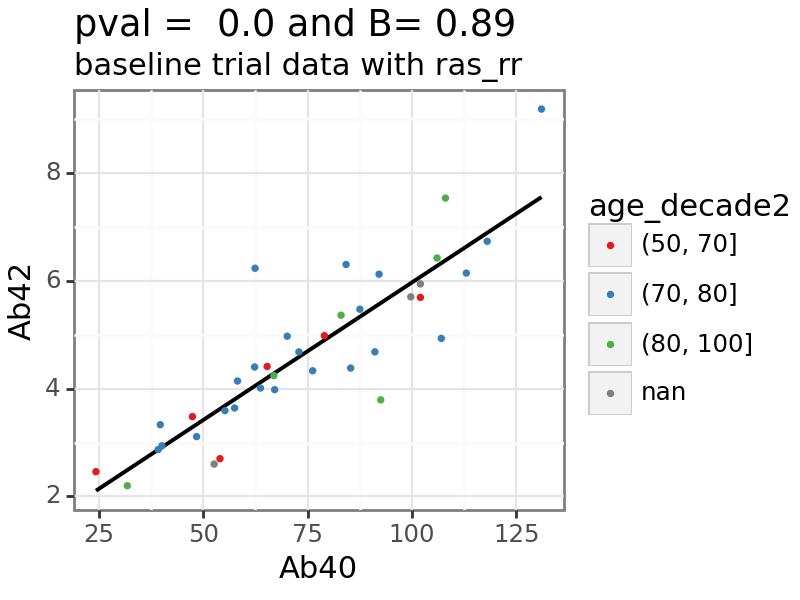

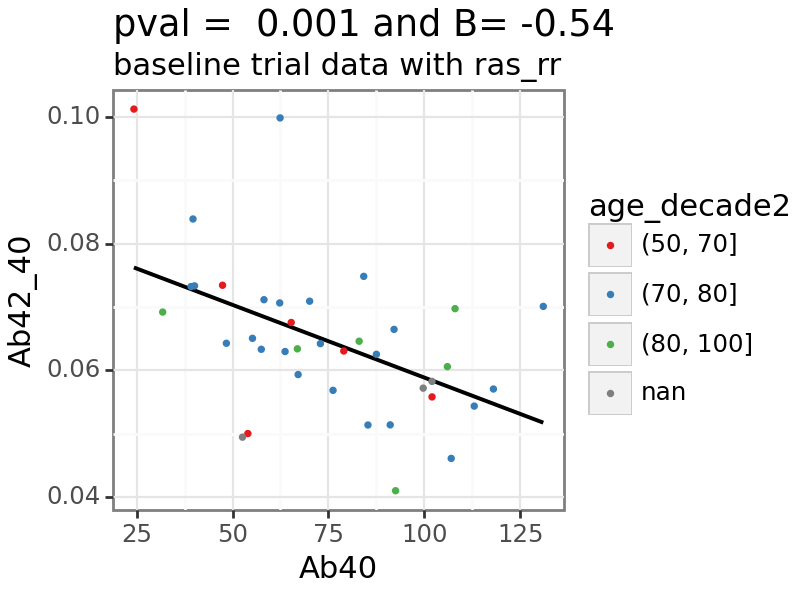

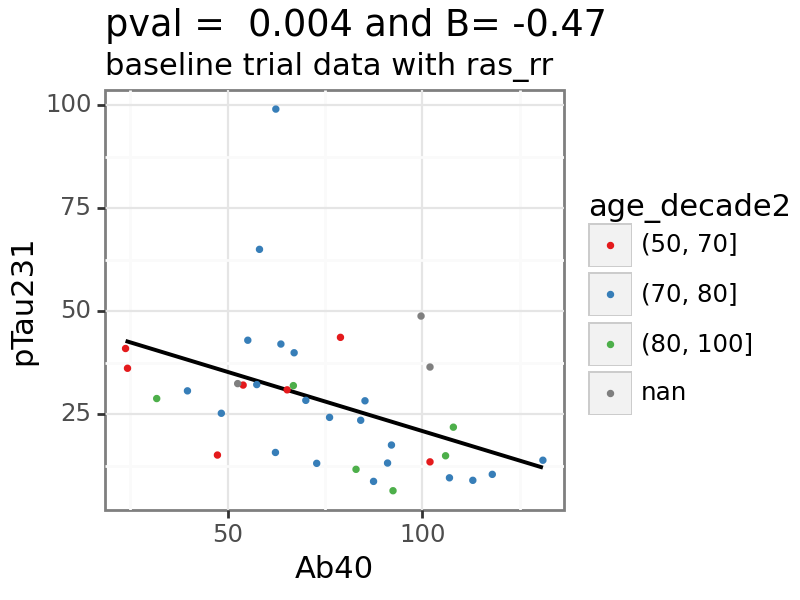

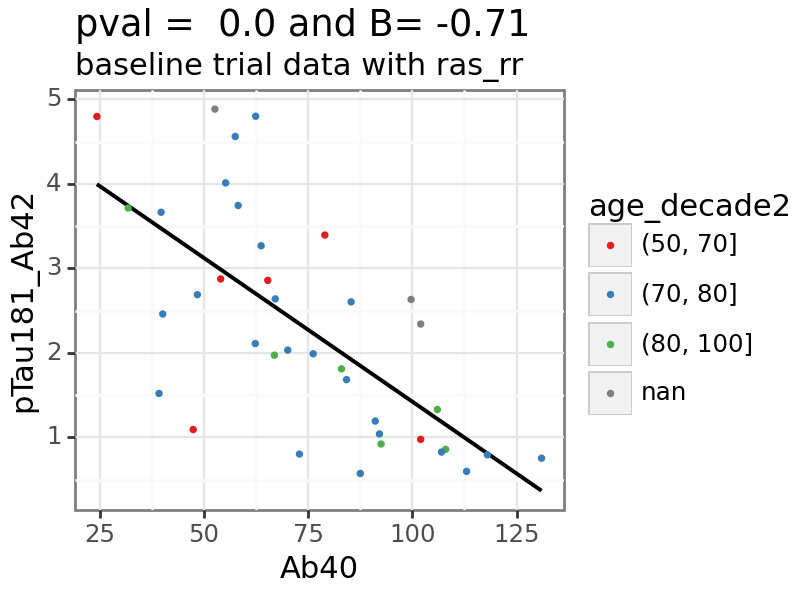

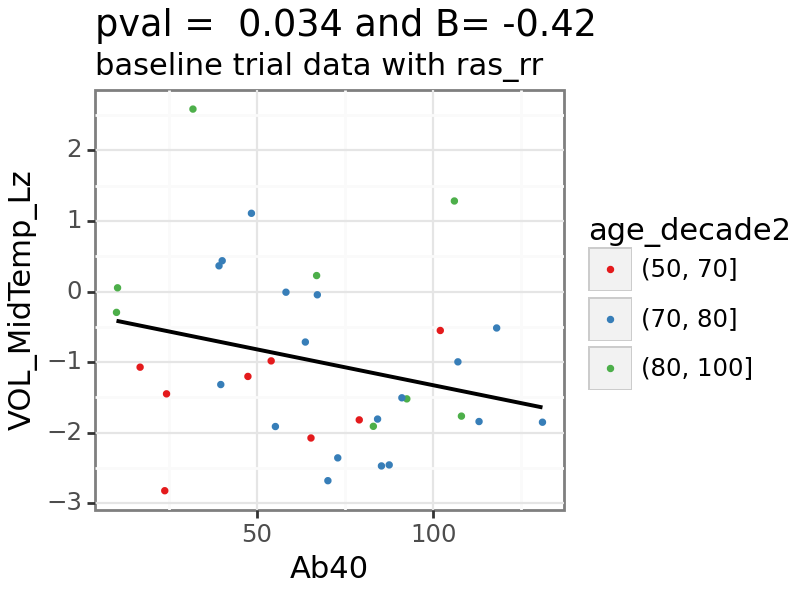

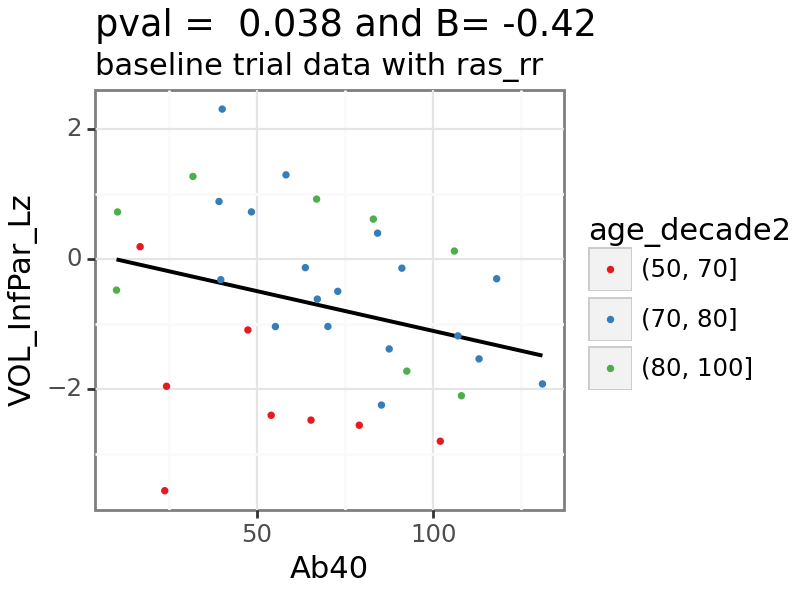

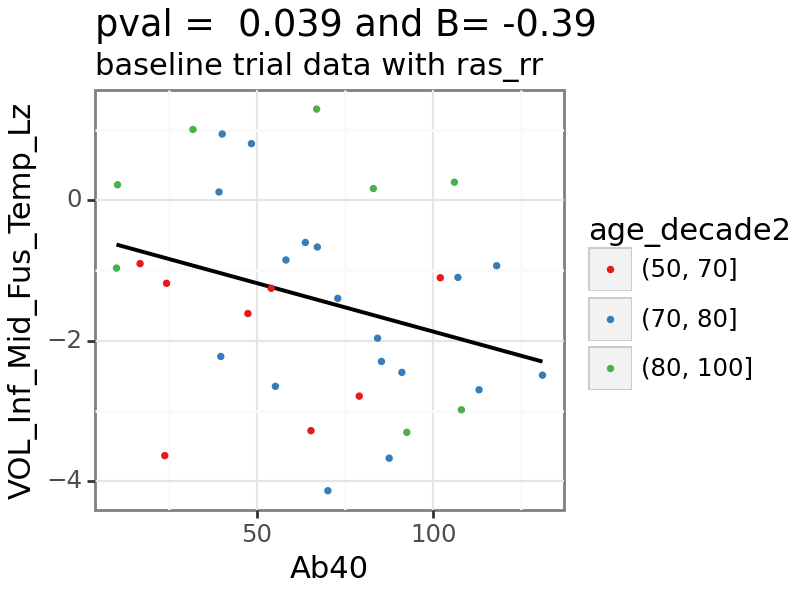

In [32]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Ab42

In [33]:
var = 'Ab42'

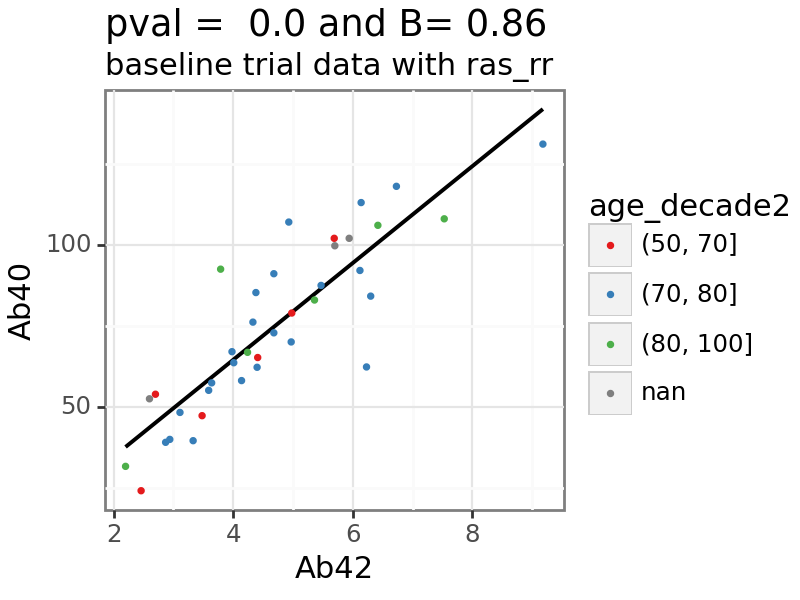

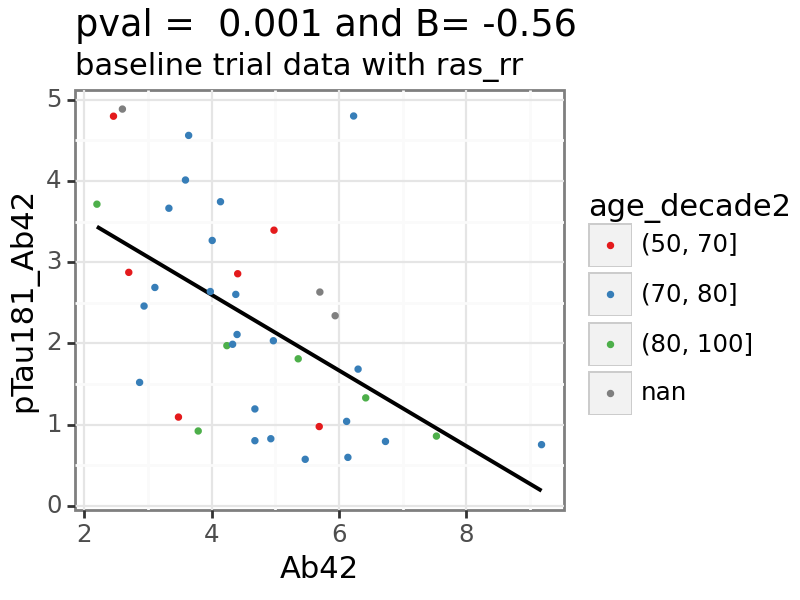

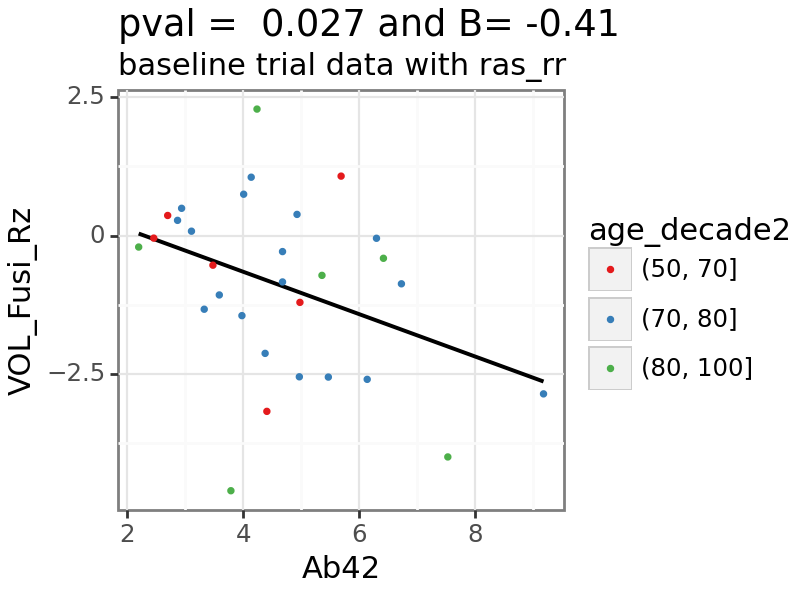

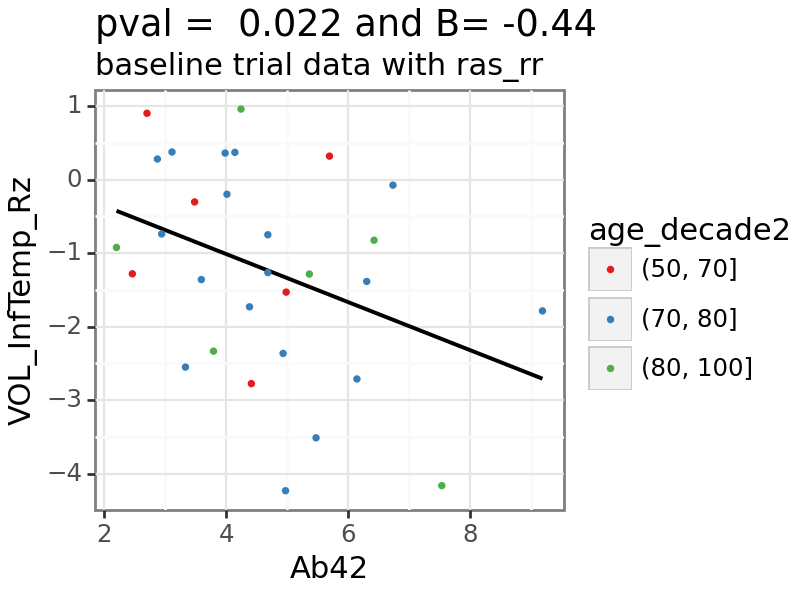

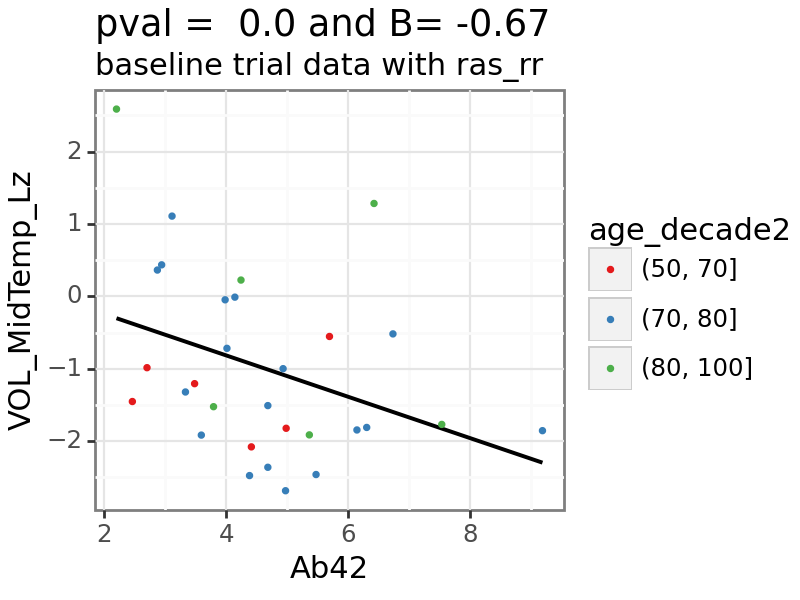

...

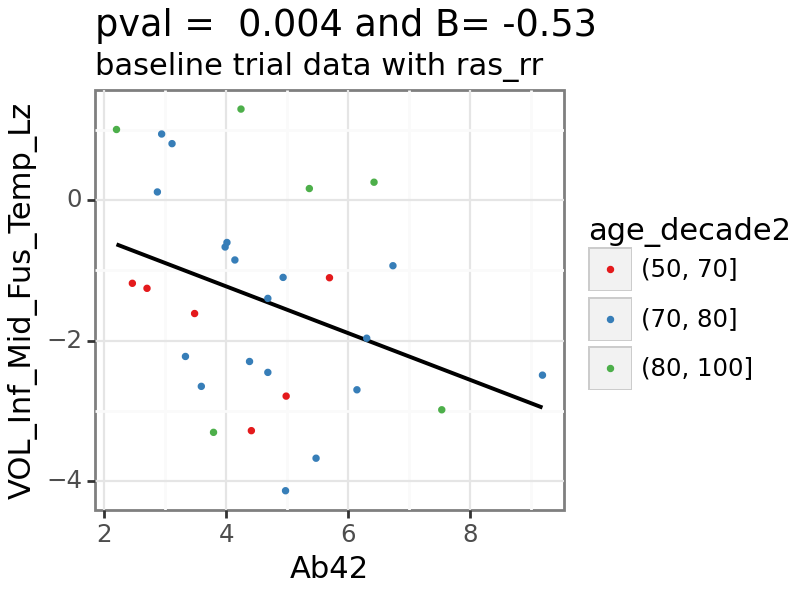

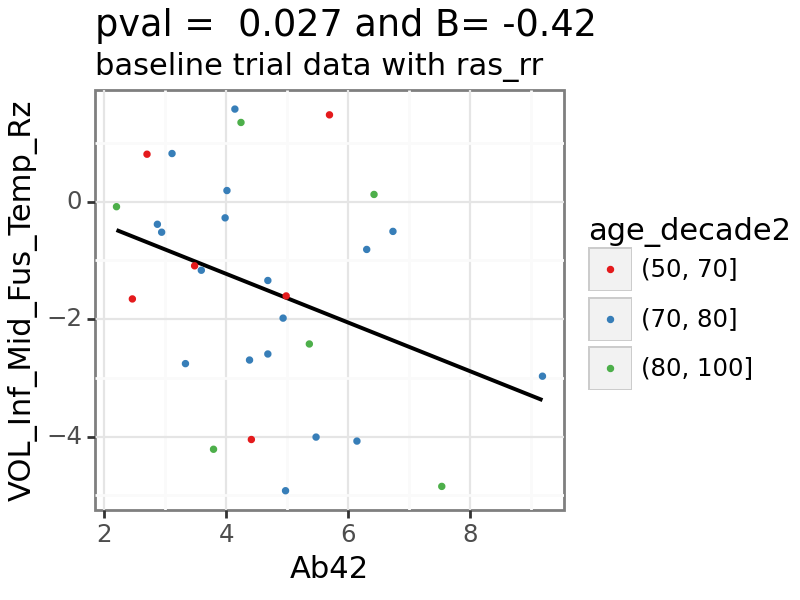

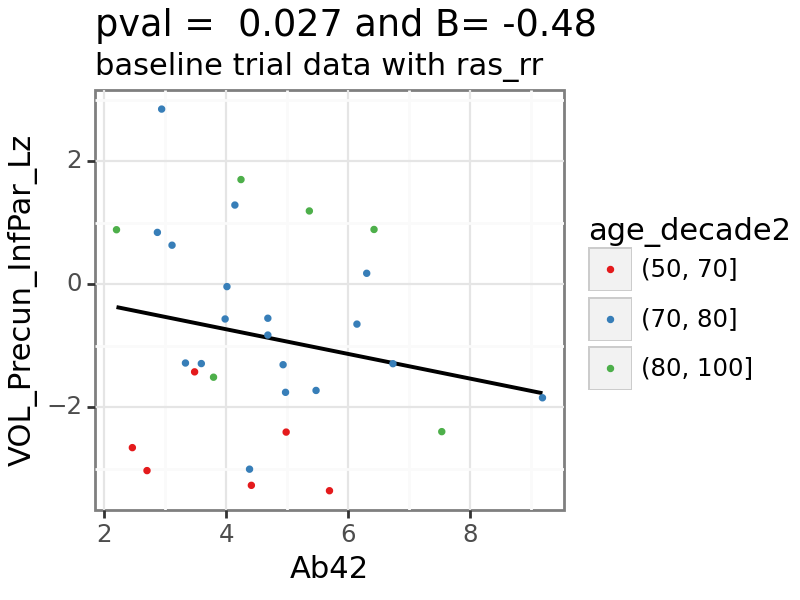

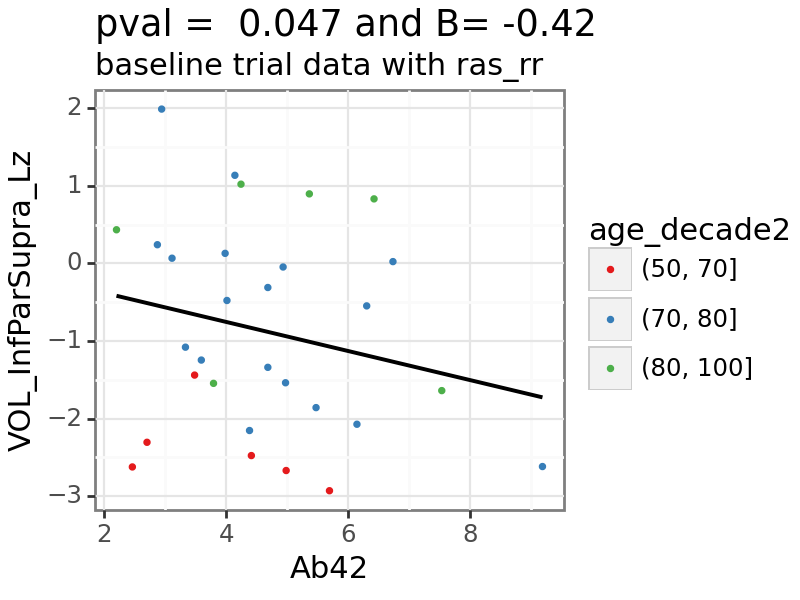

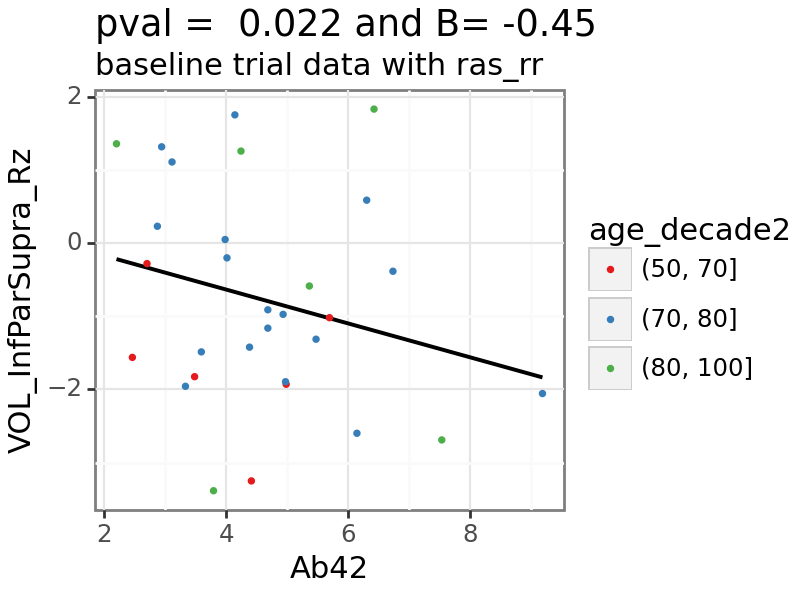

In [34]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Ab42_40

In [35]:
var = 'Ab42_40'

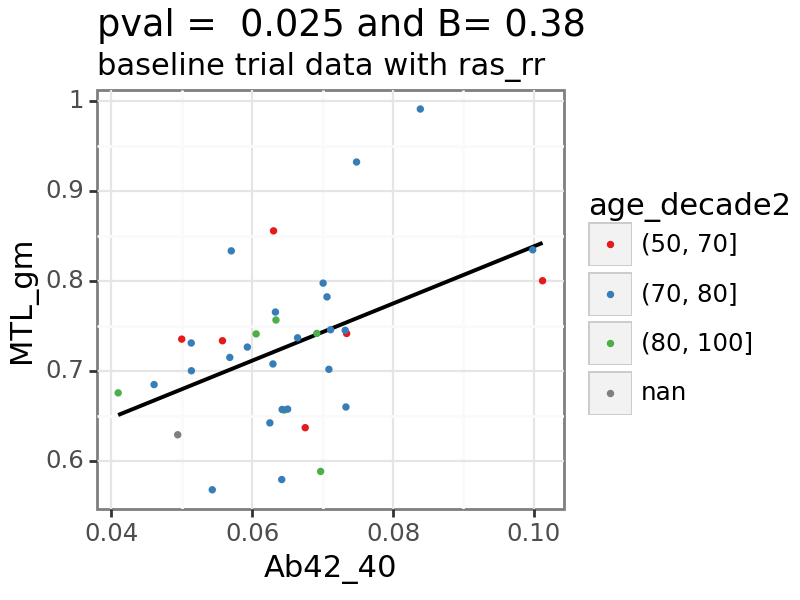

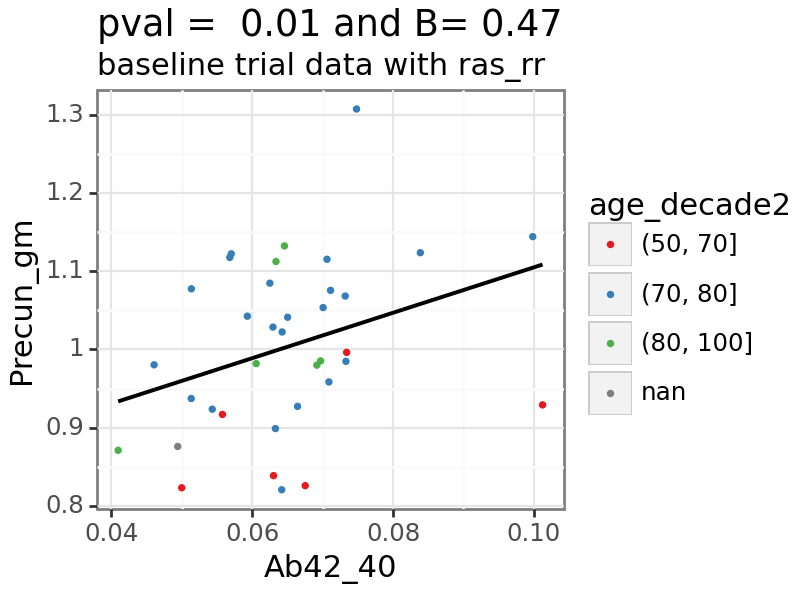

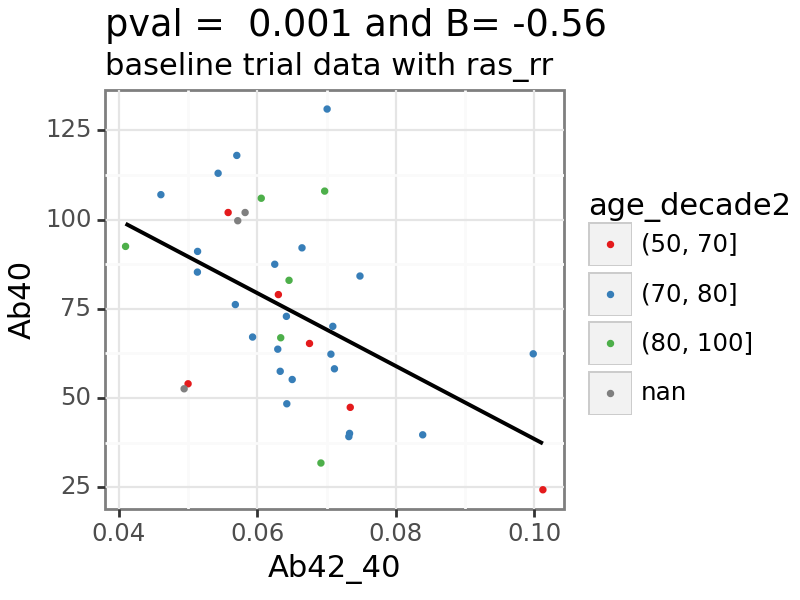

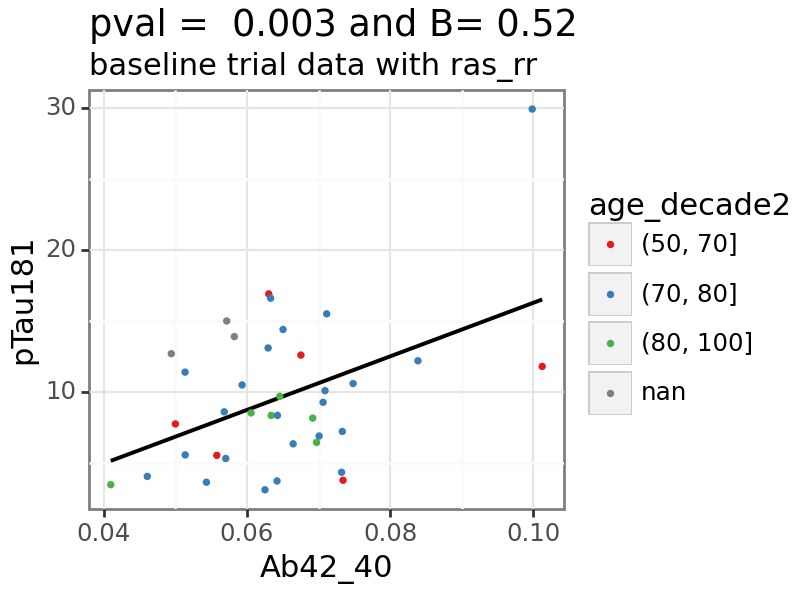

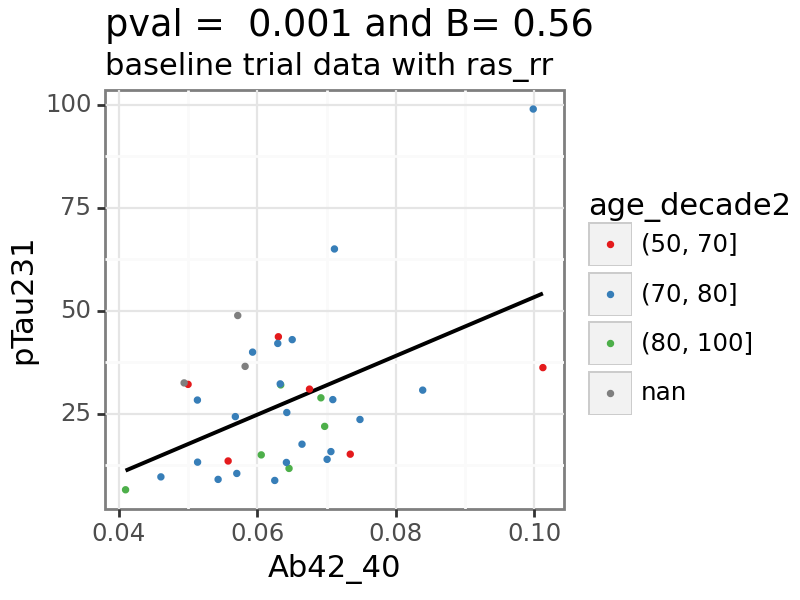

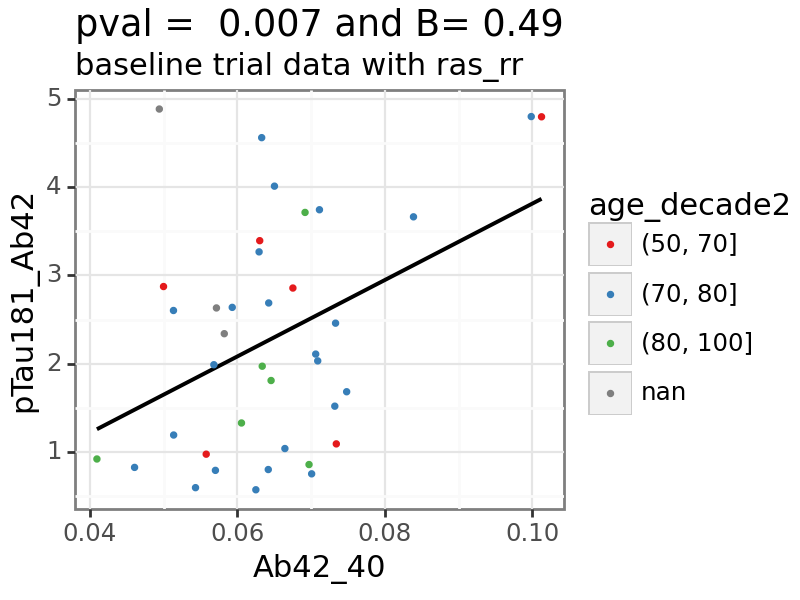

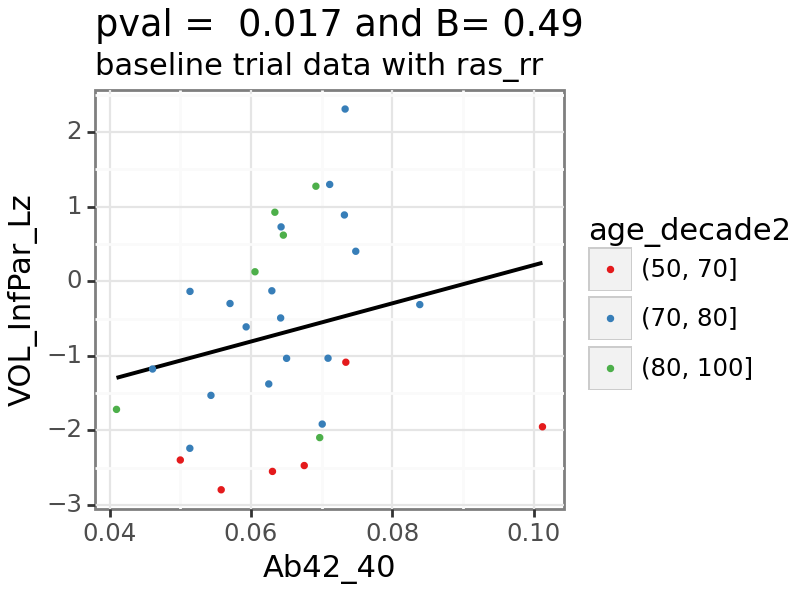

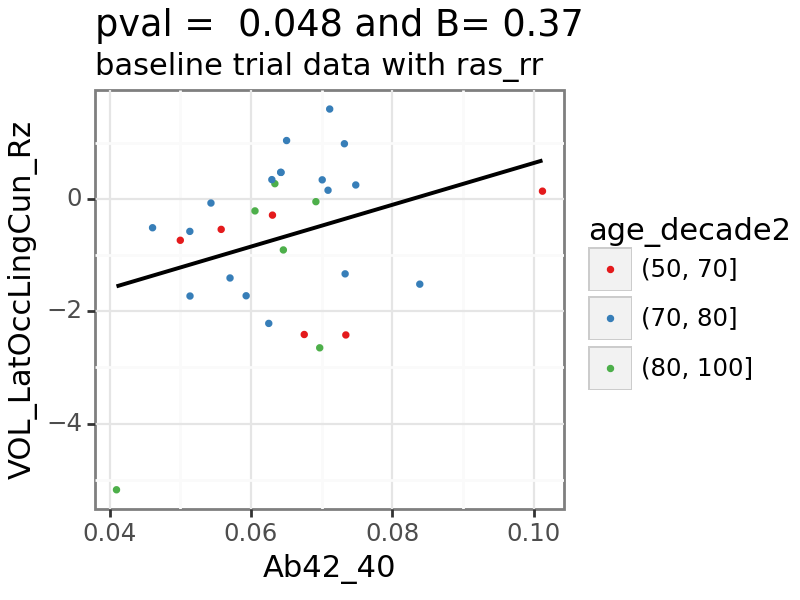

In [36]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau181


In [37]:
var = 'pTau181'

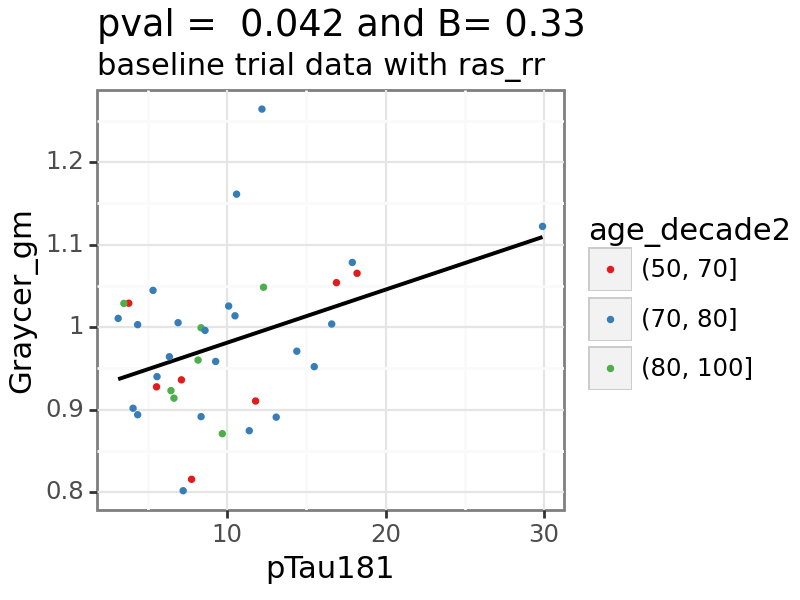

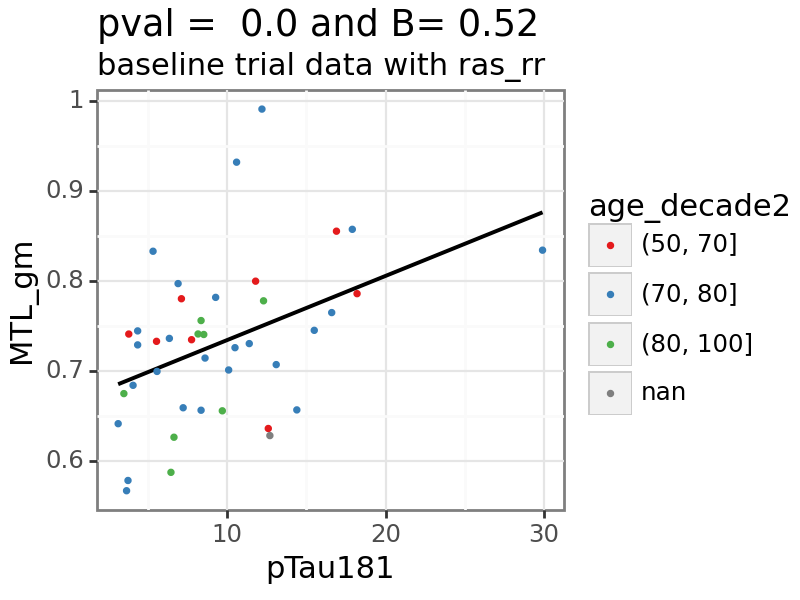

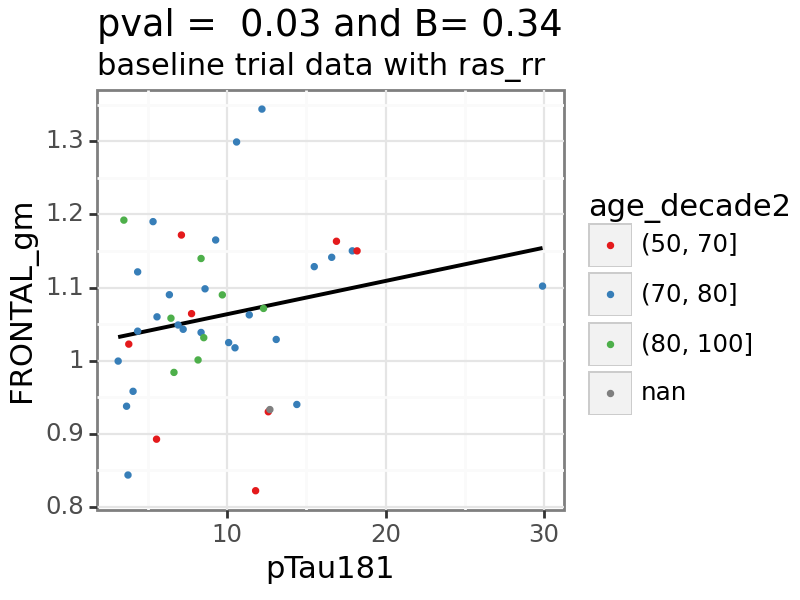

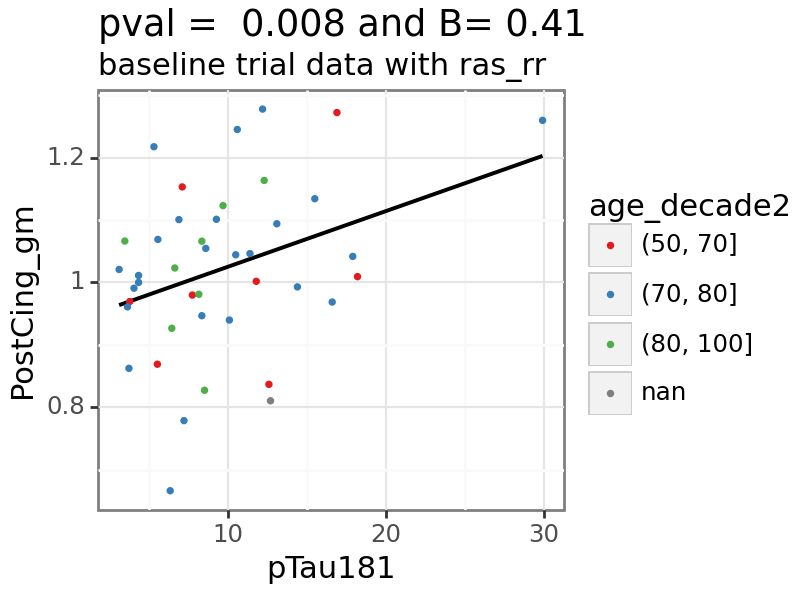

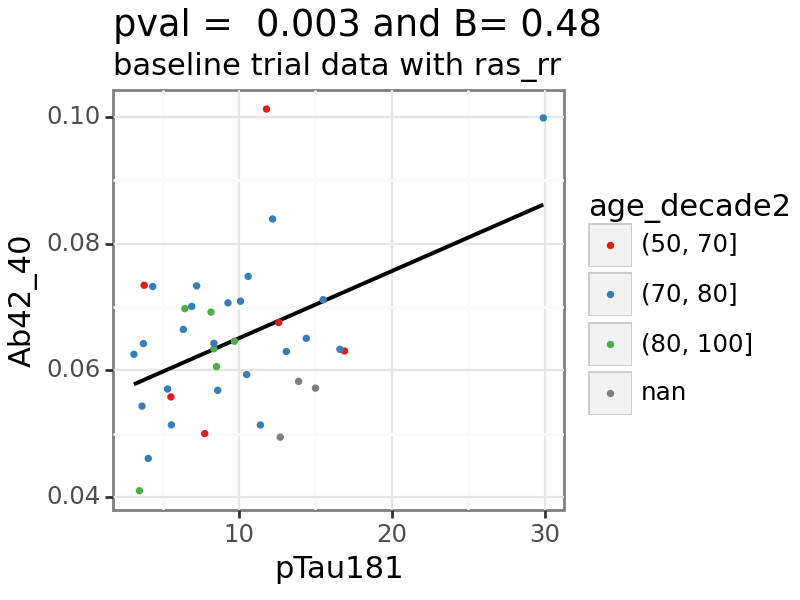

...

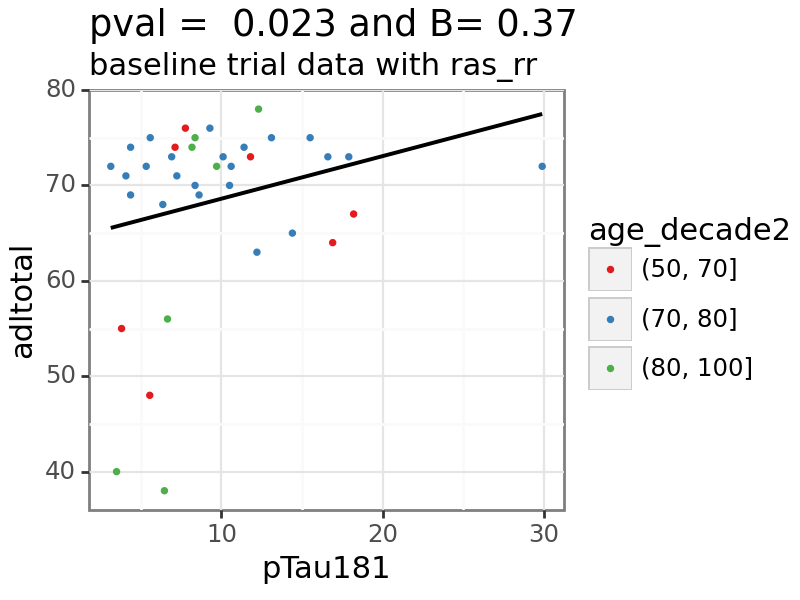

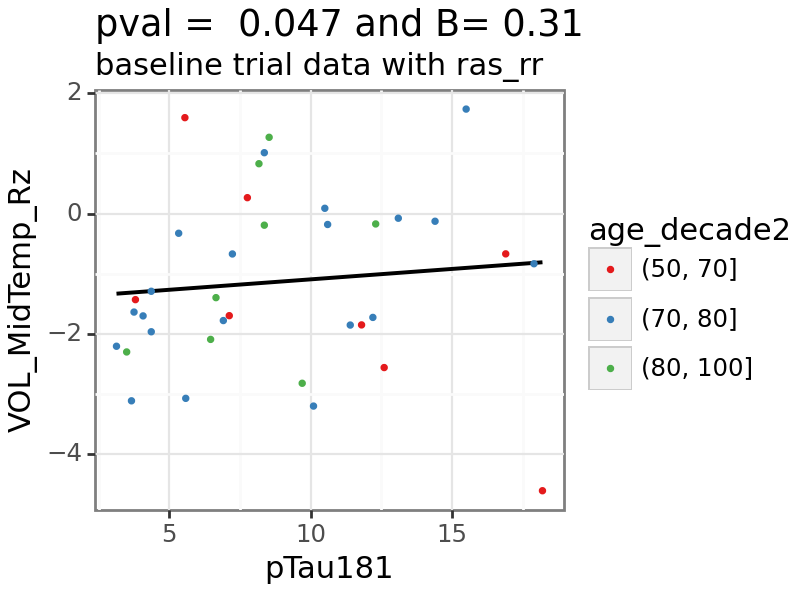

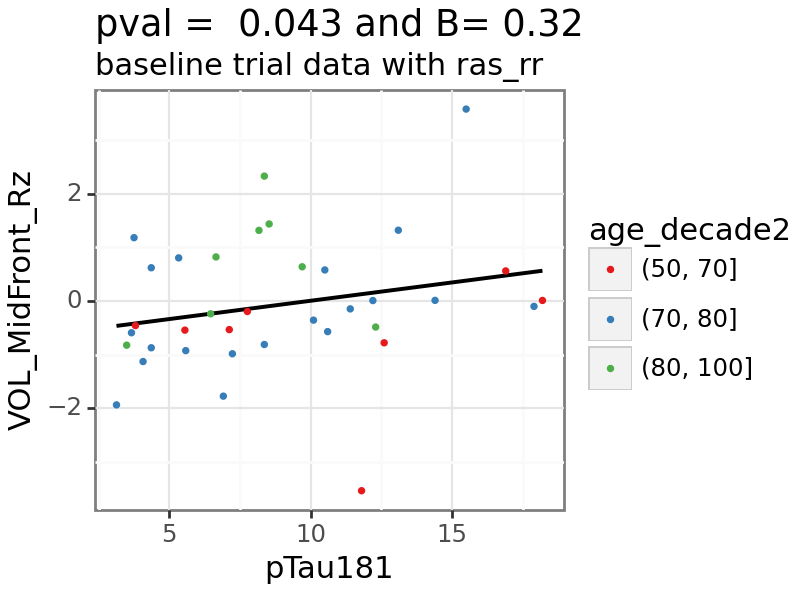

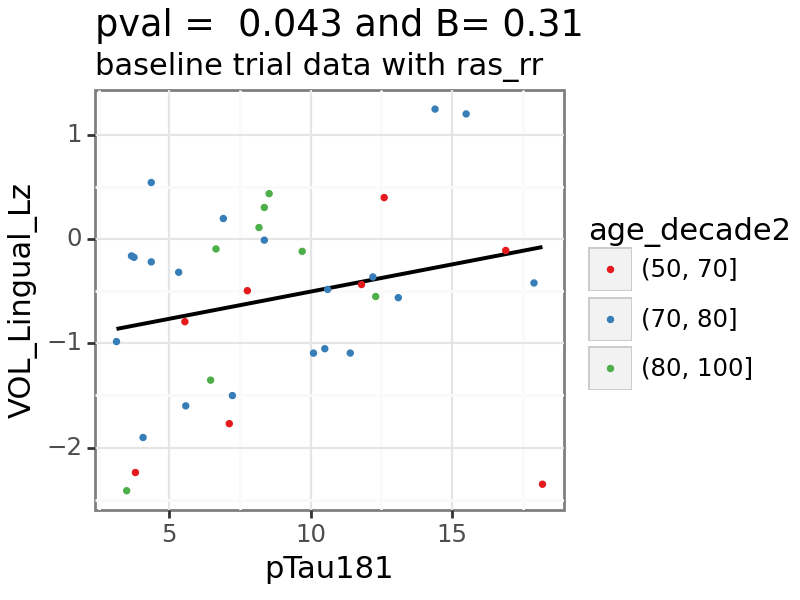

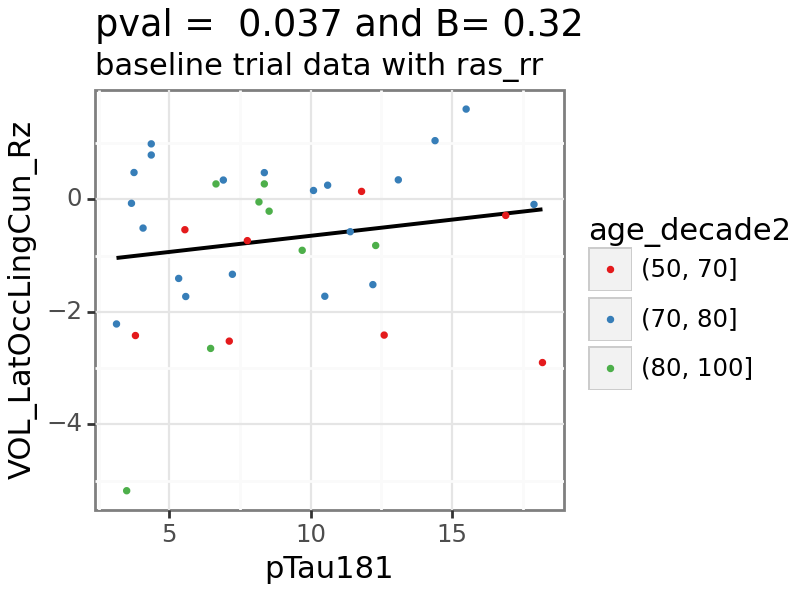

In [38]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau217

In [39]:
var = 'pTau217'

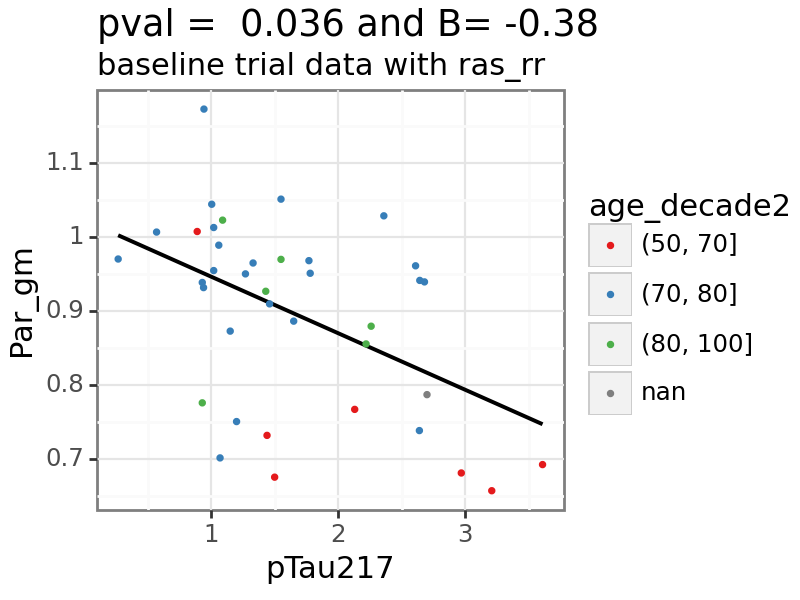

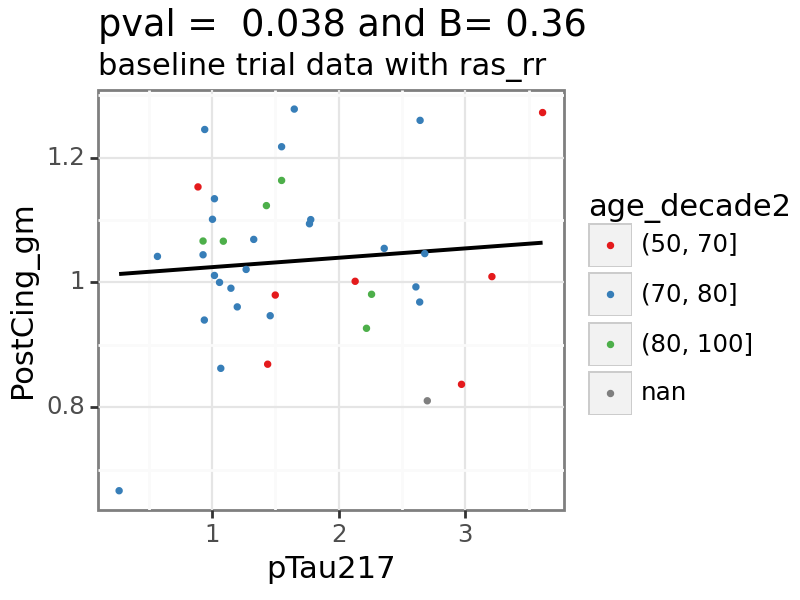

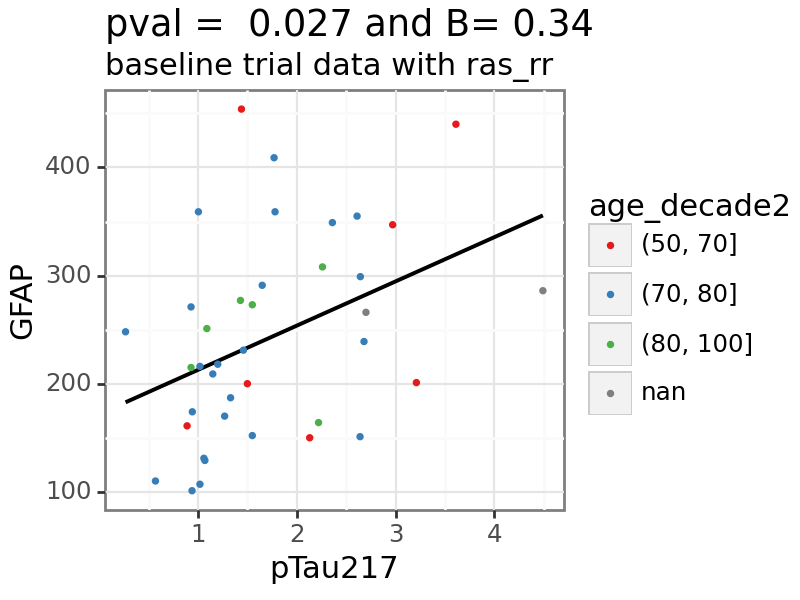

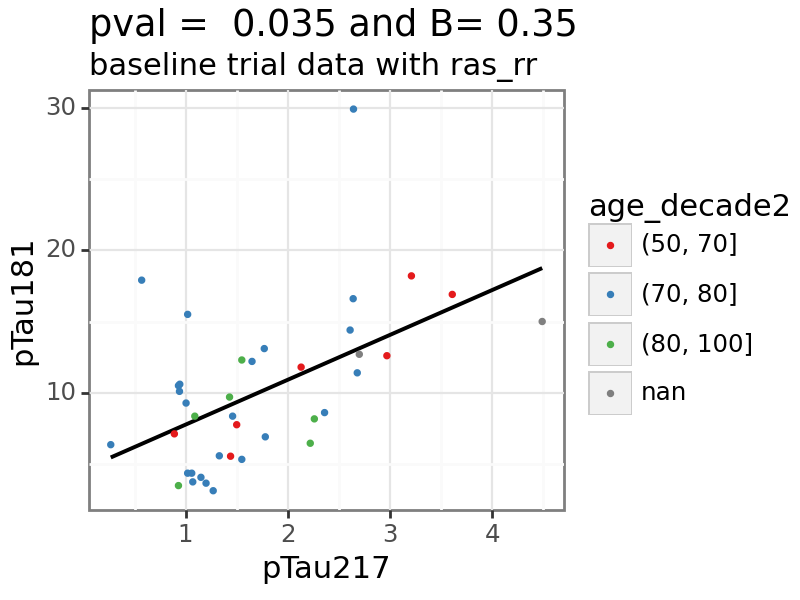

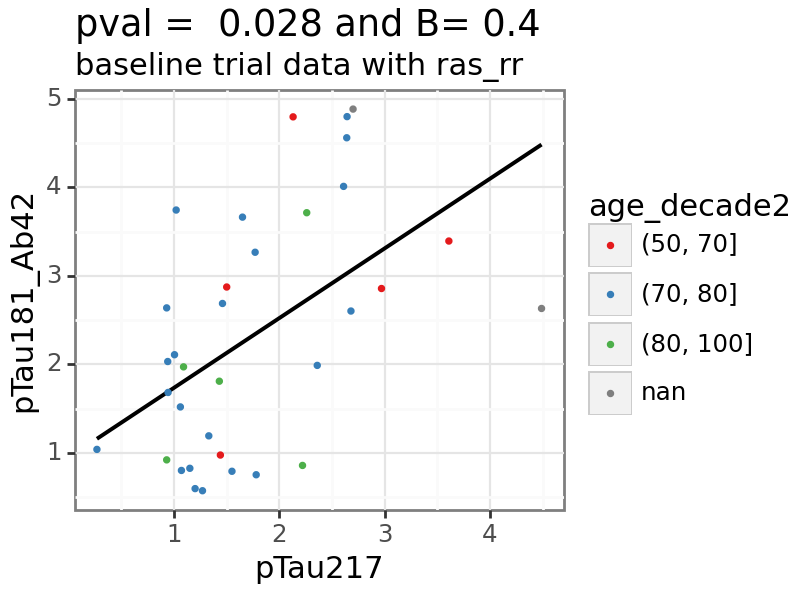

...

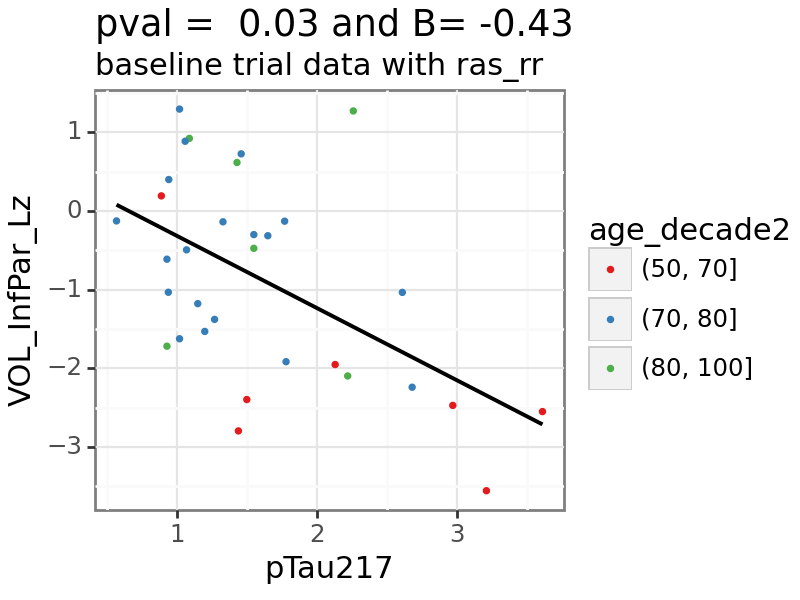

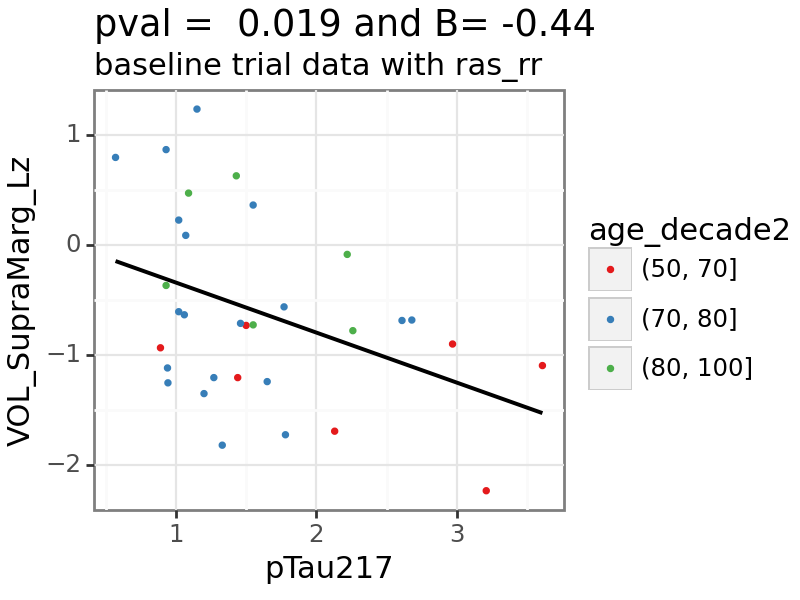

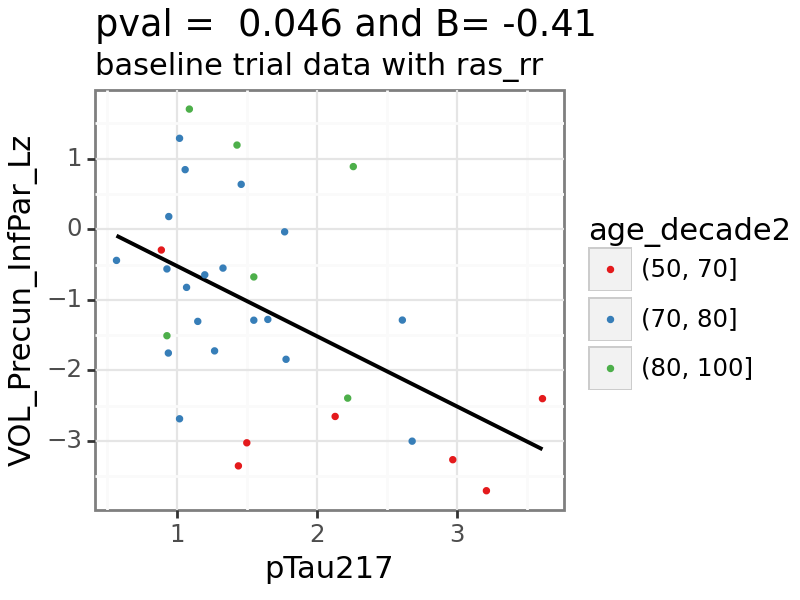

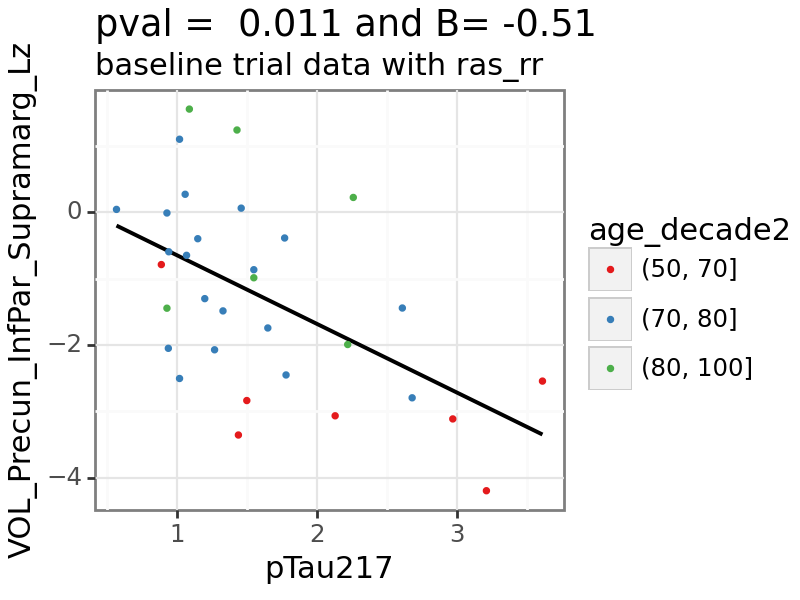

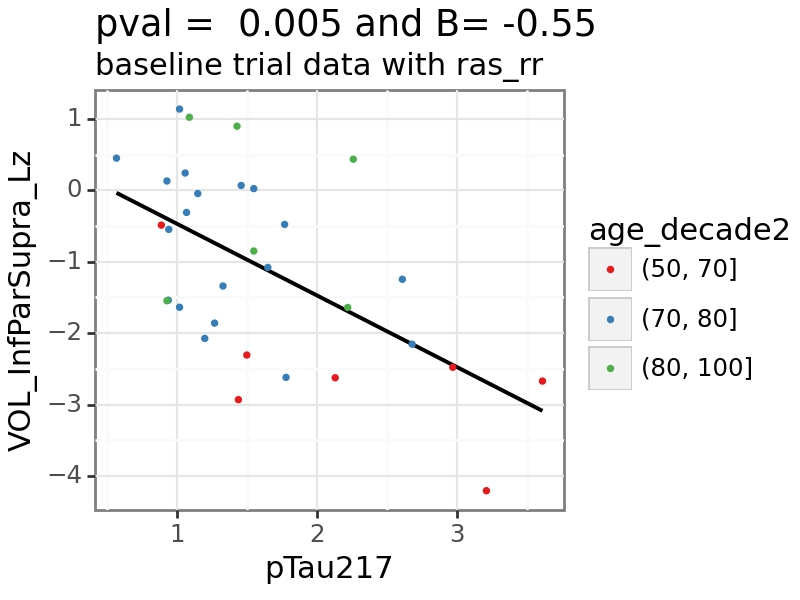

In [40]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau231

In [41]:
var = 'pTau231'

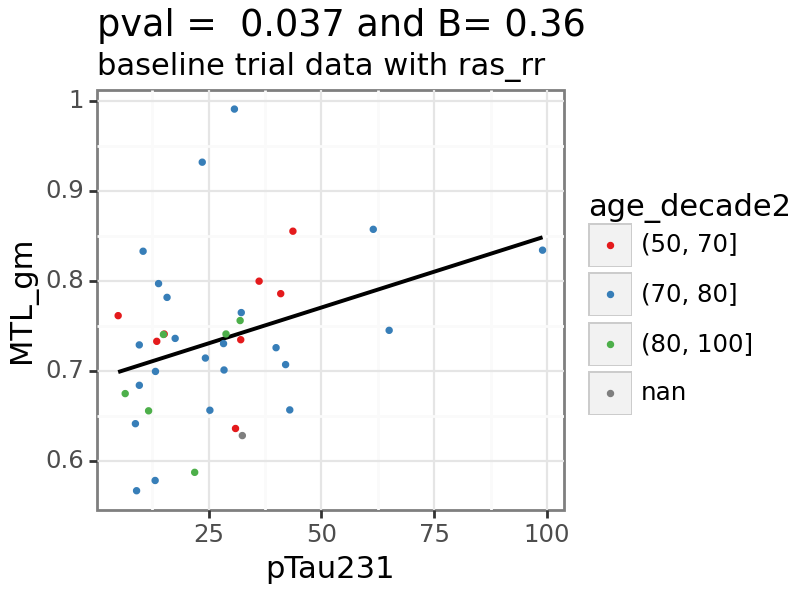

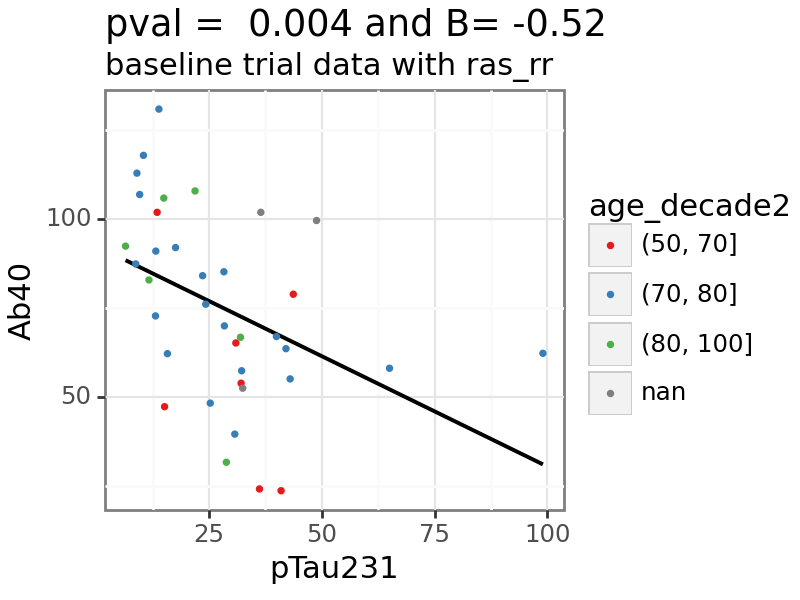

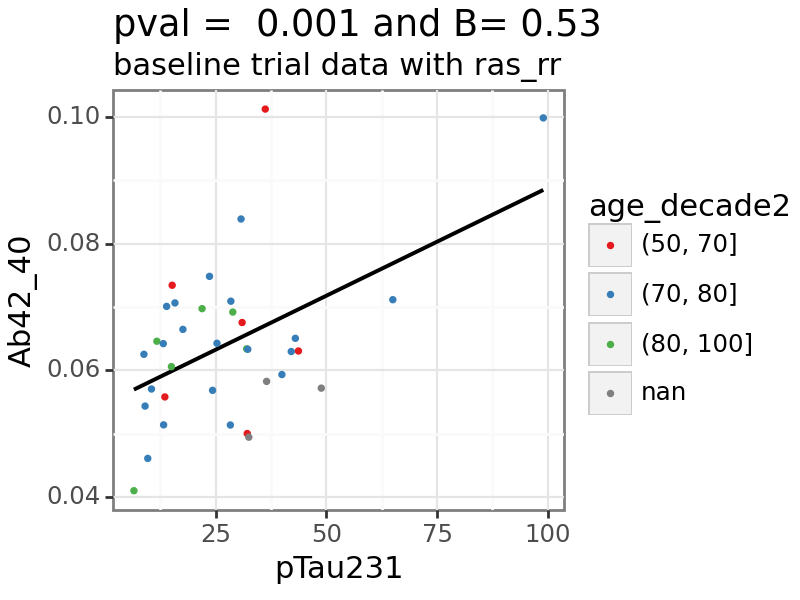

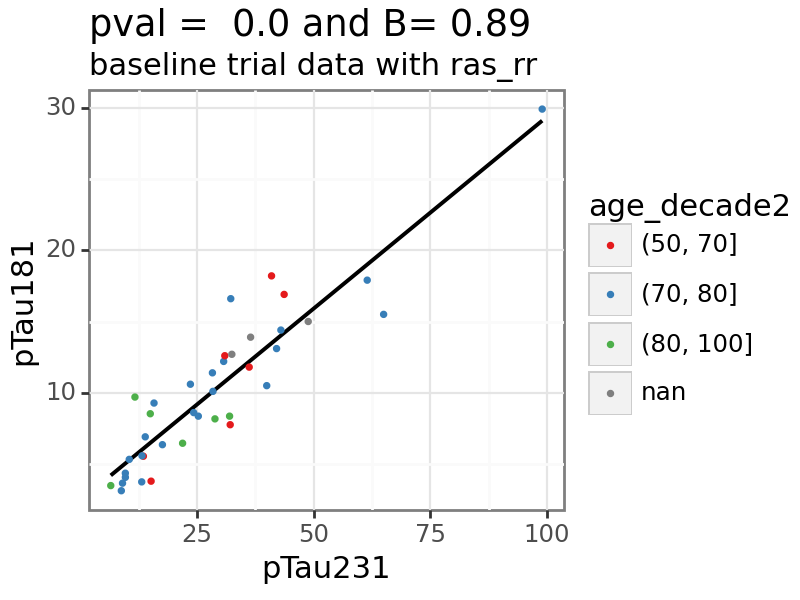

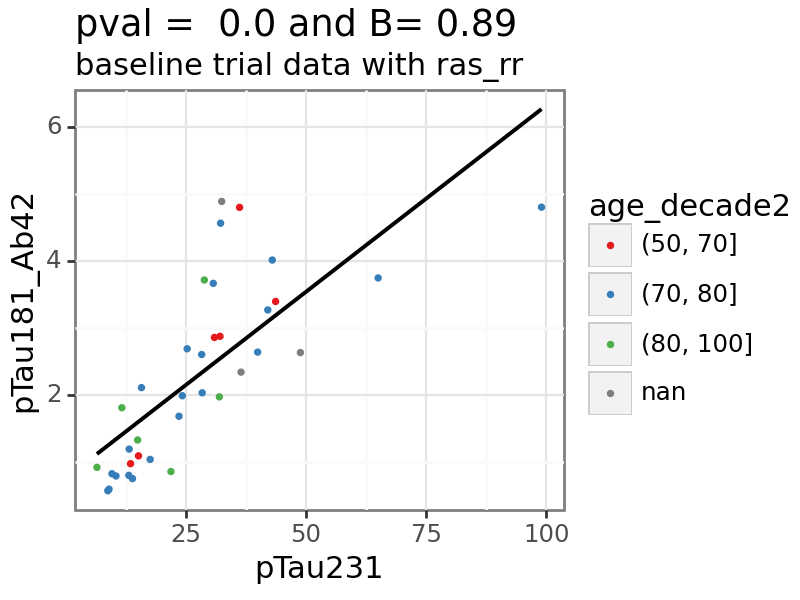

...

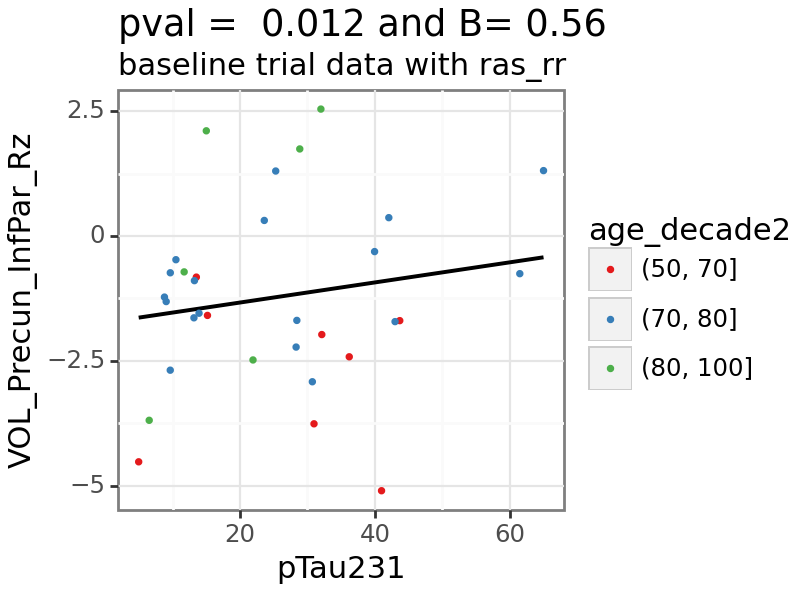

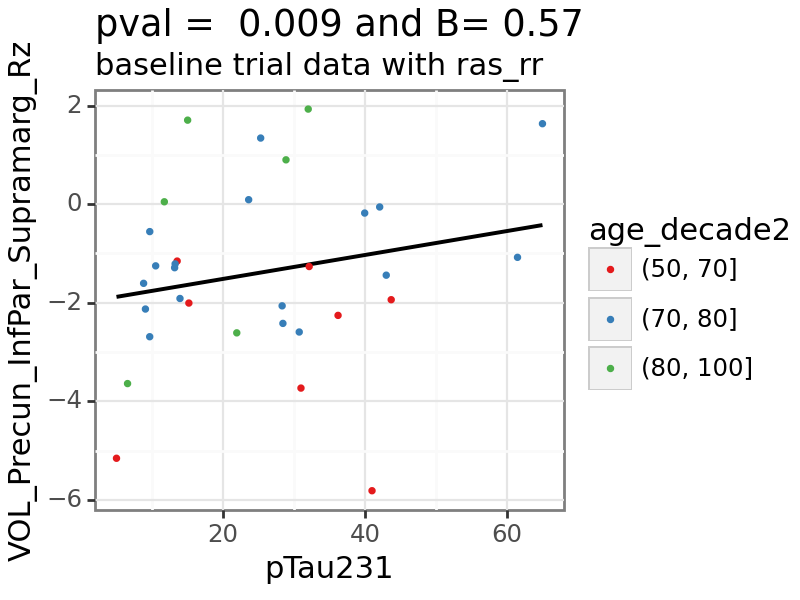

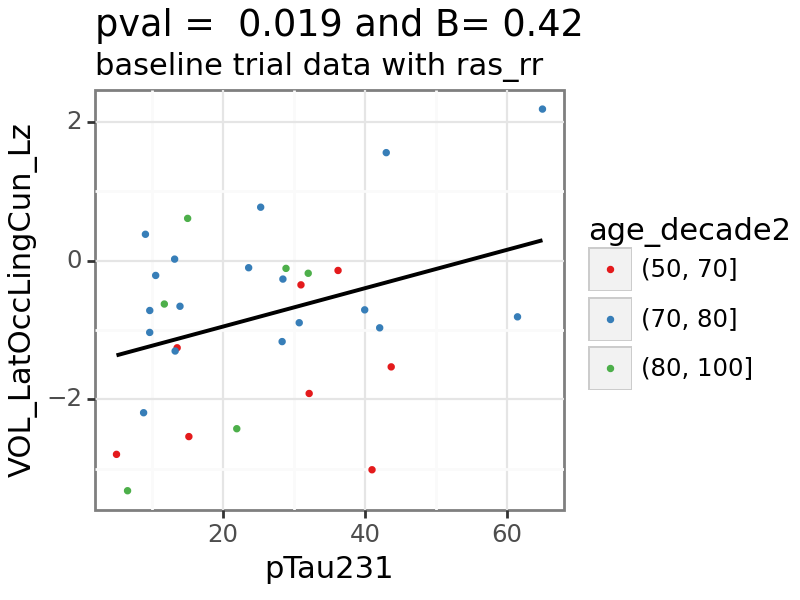

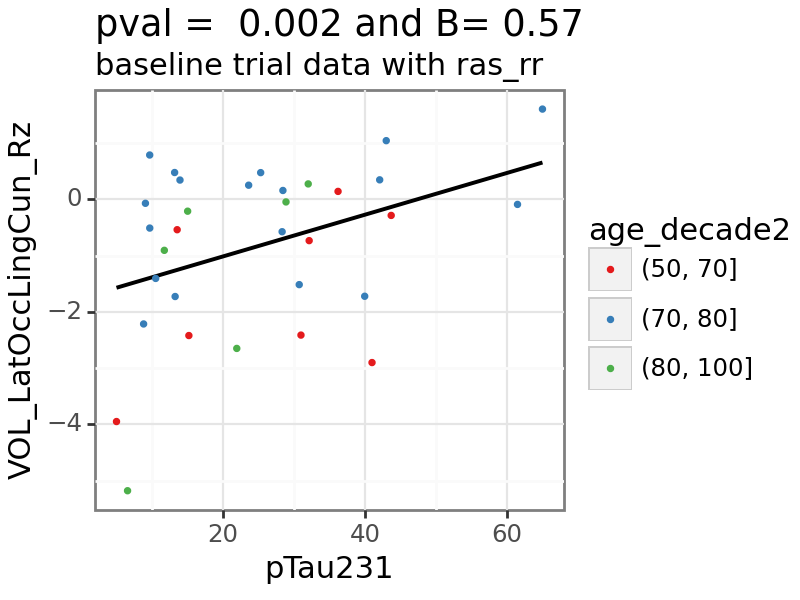

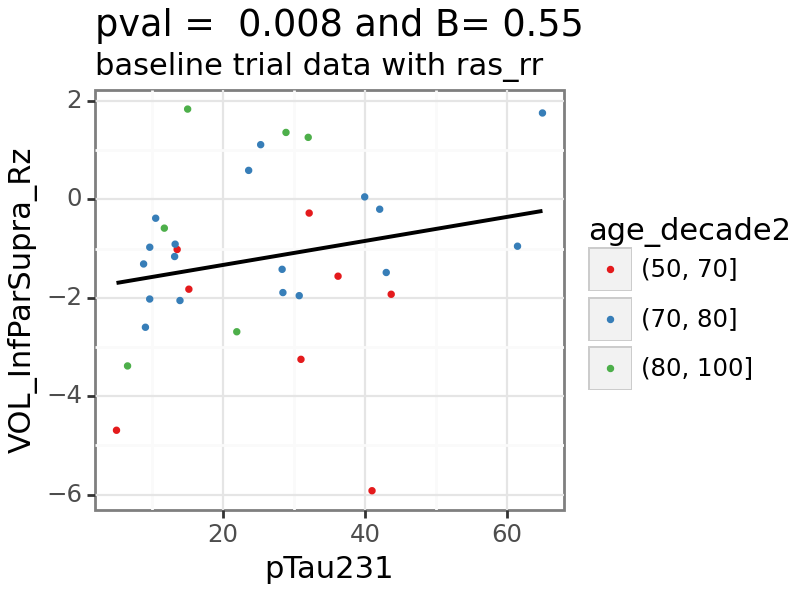

In [42]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## GFAP

In [43]:
var = 'GFAP'

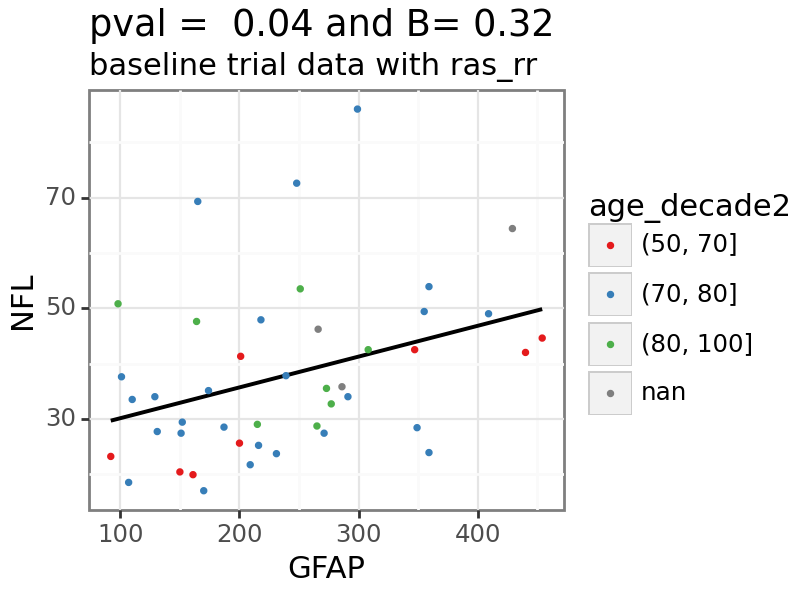

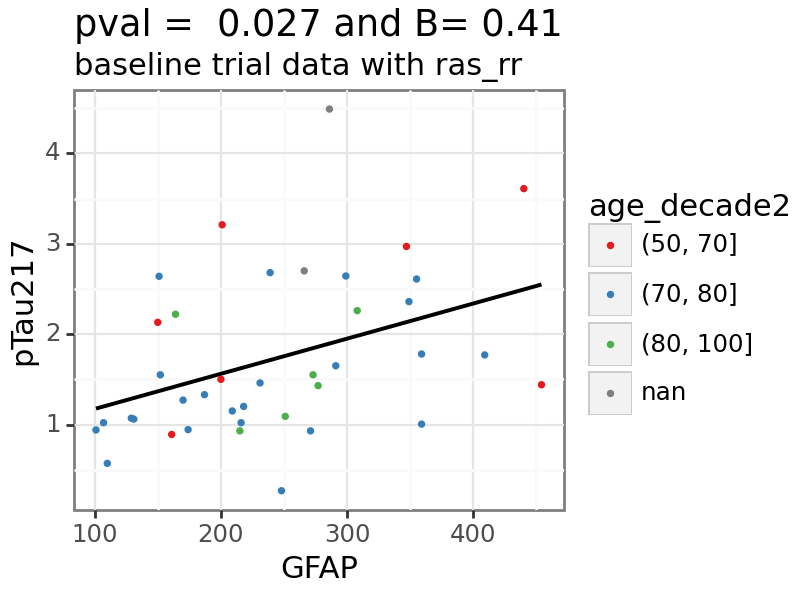

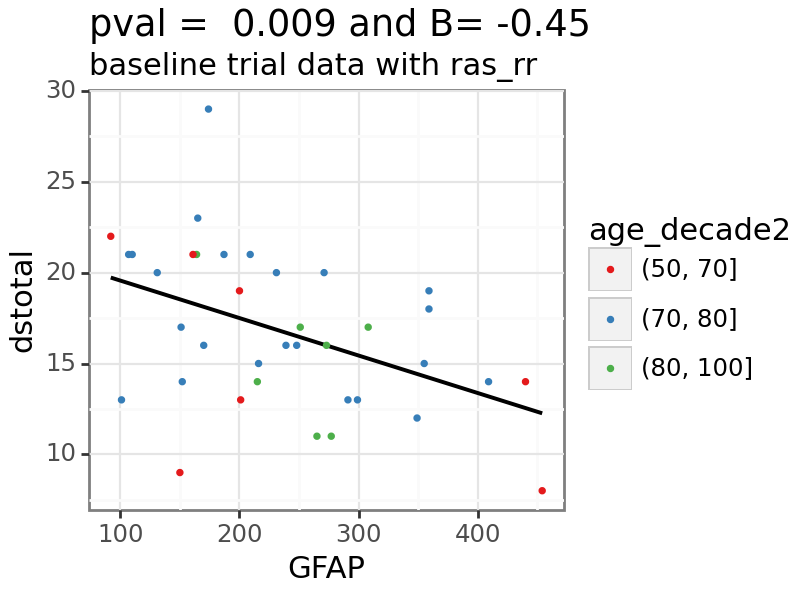

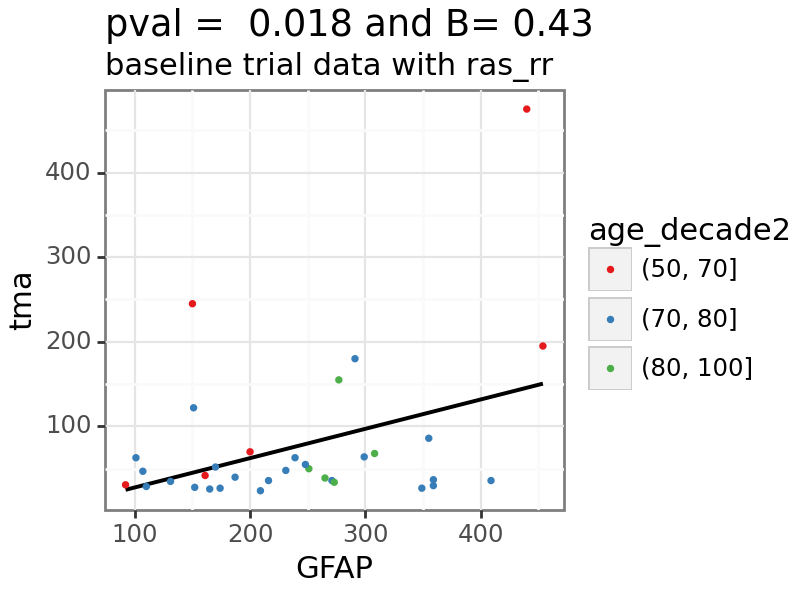

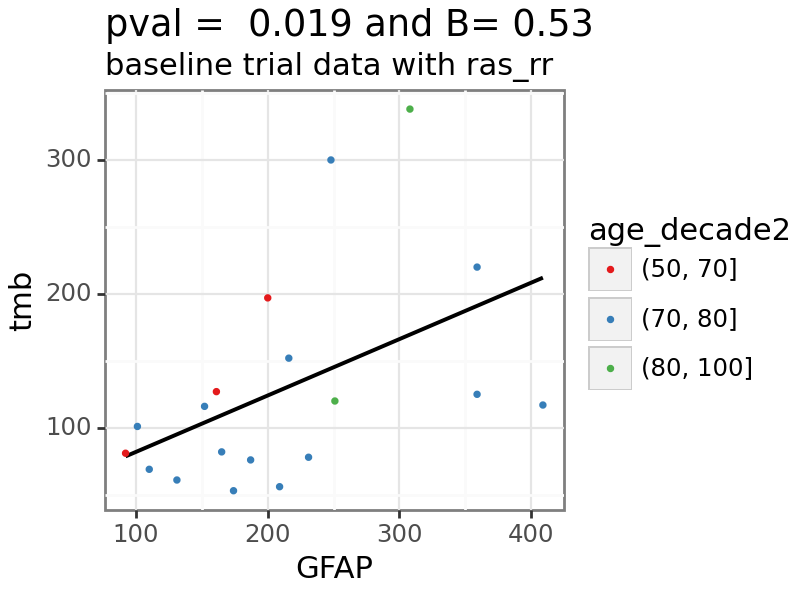

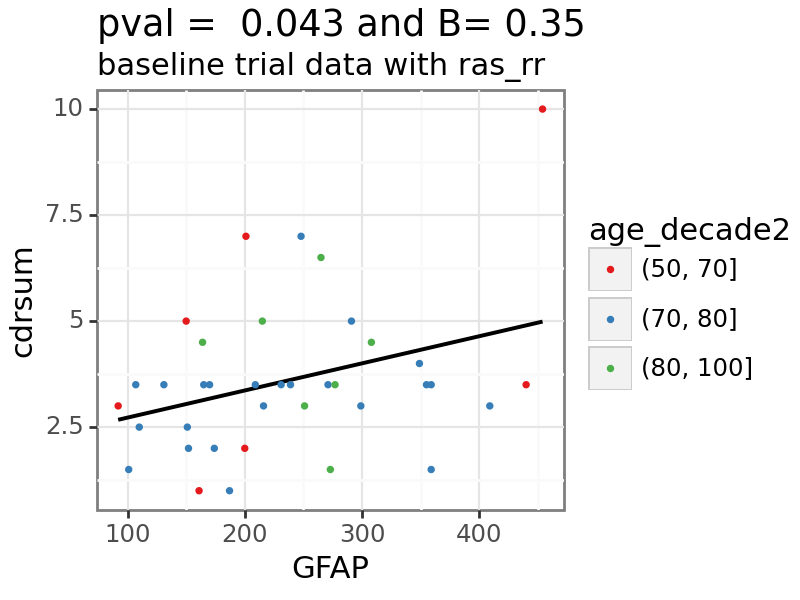

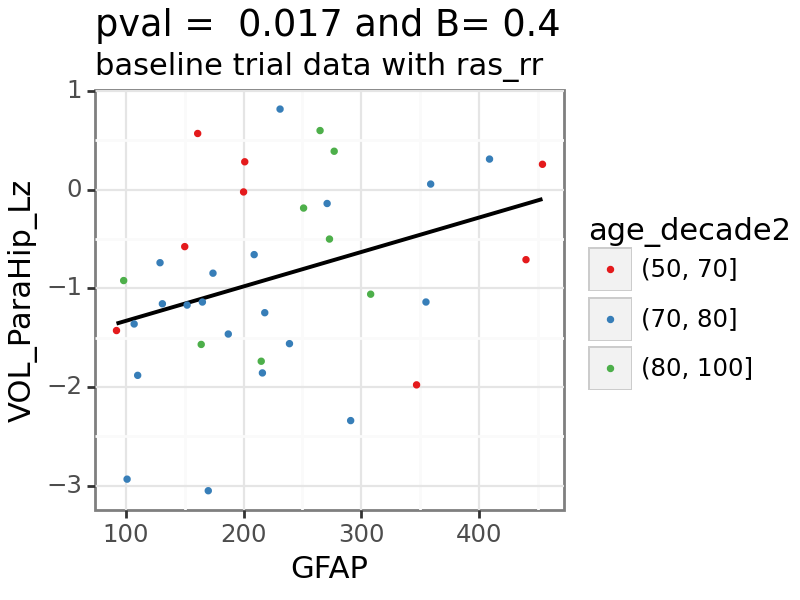

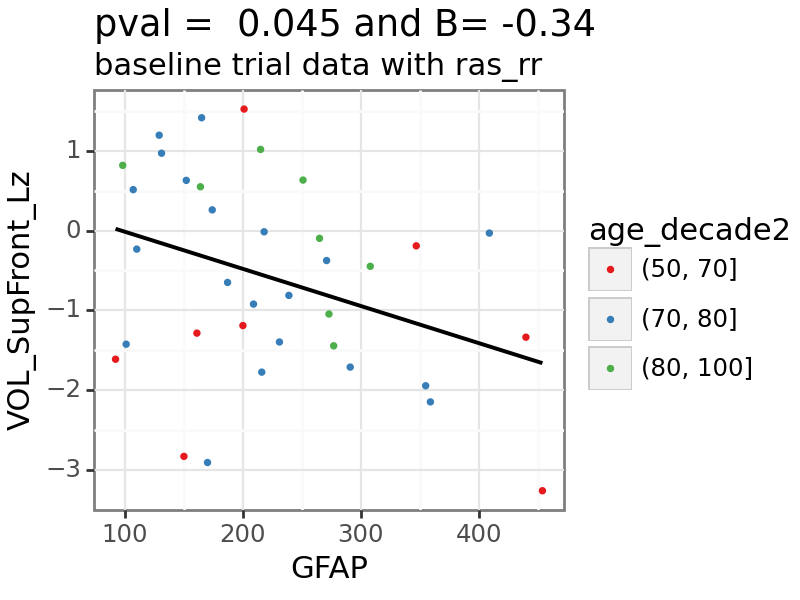

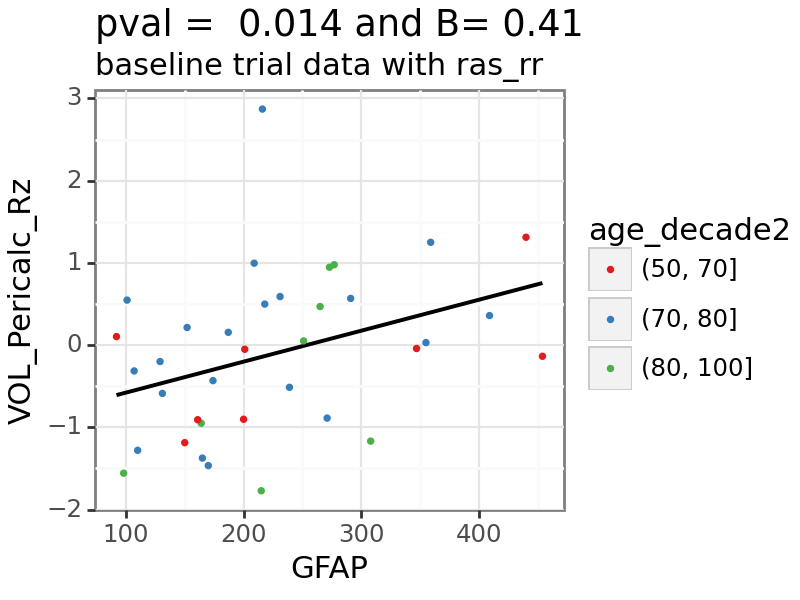

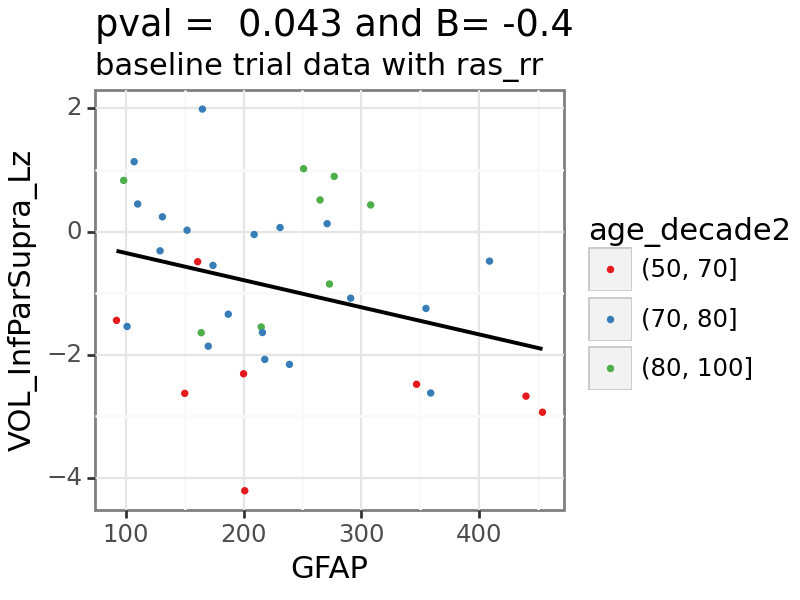

In [44]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## NFL

In [45]:
var = 'NFL'

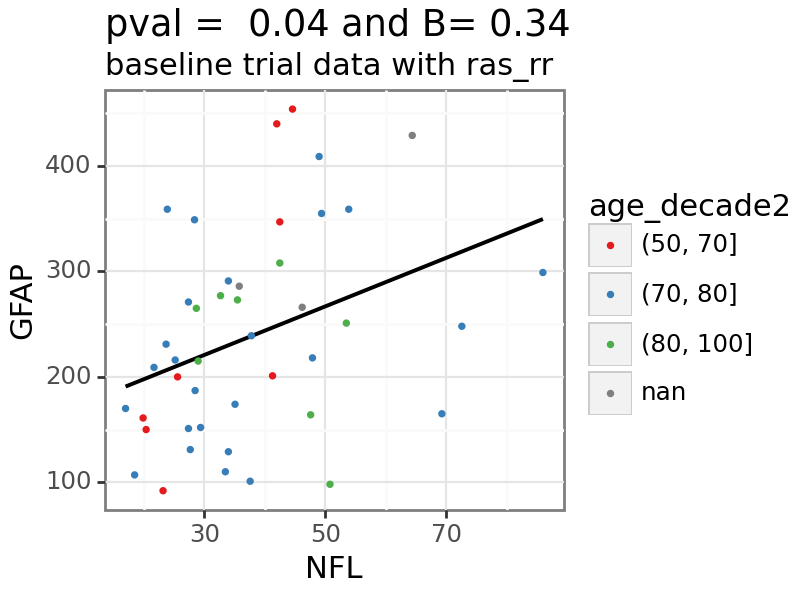

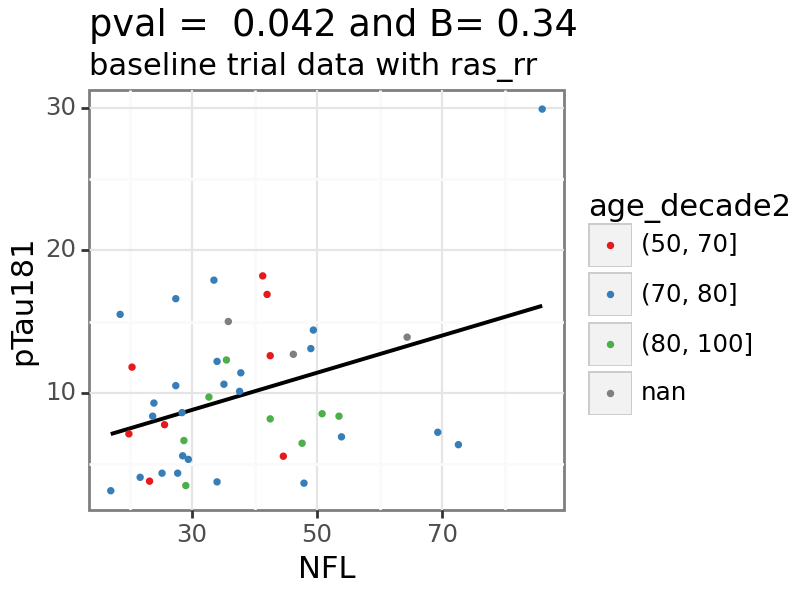

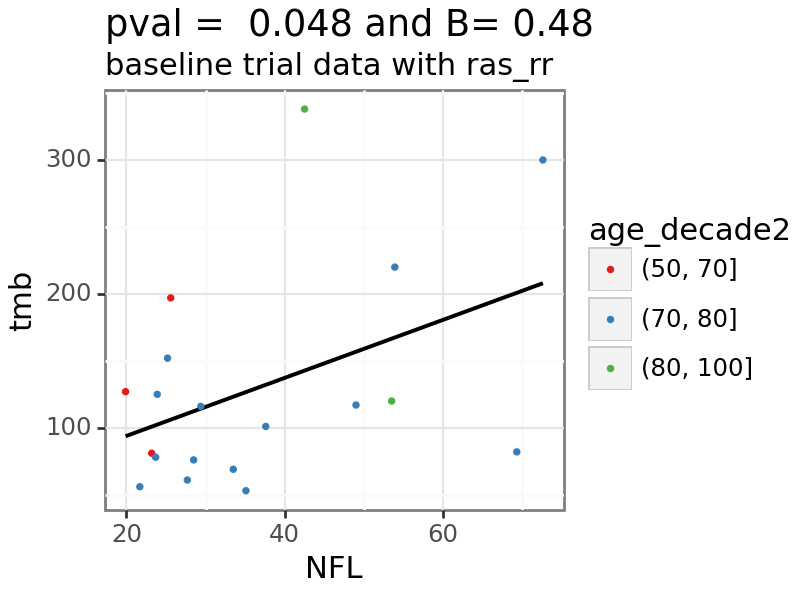

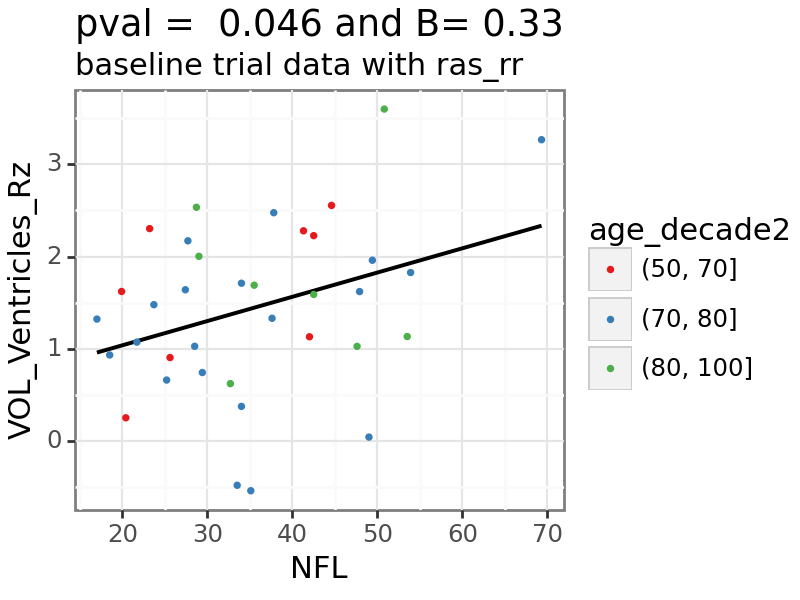

In [46]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau181_Ab42_40

In [47]:
var = 'pTau181_Ab42_40'

In [48]:
p9.options.figure_size = (4,3)    
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[pvals_to_consider].min(axis = 1)<graphing_pval), 
    'var2']
for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 10)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            #+ p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1)
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# Plot reverse direction relationships split by other factors

In [49]:
baseline_trial_data['MMSE_bin'] = pd.qcut(baseline_trial_data['MMSE'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['cdrsum_bin'] = pd.qcut(baseline_trial_data['cdrsum'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['Ab42_40_log10_bin'] = pd.qcut(baseline_trial_data['Ab42_40_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['pTau217_log10_bin'] = pd.qcut(baseline_trial_data['pTau217_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['GFAP_log10_bin'] = pd.qcut(baseline_trial_data['GFAP_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['NFL_log10_bin'] = pd.qcut(baseline_trial_data['NFL_log10'], [0, .33, .66, 1.], precision = 2).astype('str')
baseline_trial_data['VOL_Hip_Rz_bin'] = pd.qcut(baseline_trial_data['VOL_Hip_Rz'], [0, .33, .66, 1.], precision = 2).astype('str')

C:\Users\Lauren.Koenig\AppData\Local\Temp\4\ipykernel_46816\4187745018.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\4\ipykernel_46816\4187745018.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Lauren.Koenig\AppData\Local\Temp\4\ipykernel_46816\4187745018.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https:

## Age decade 2

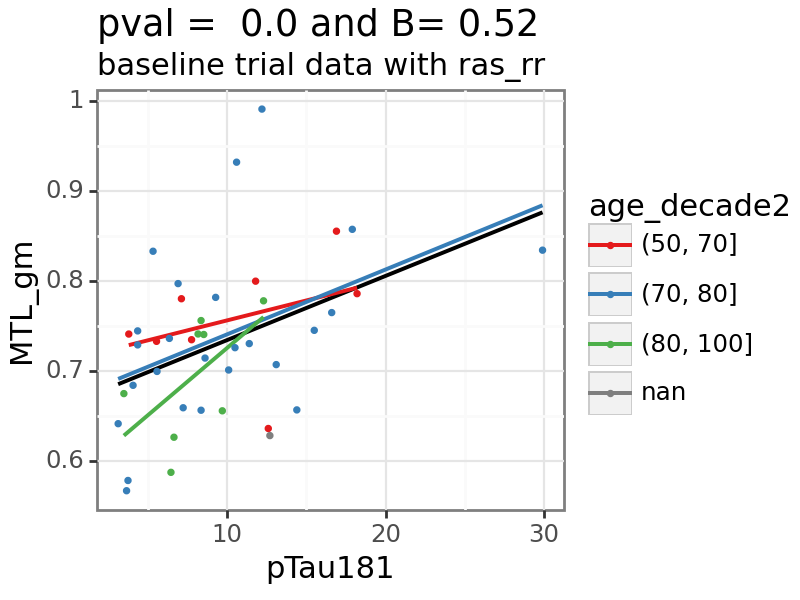

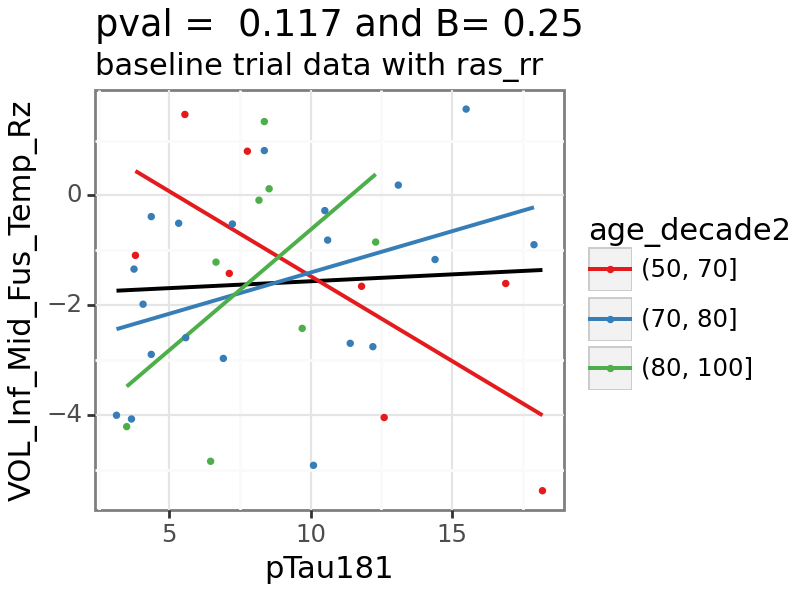

In [50]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## CDR sum of boxes

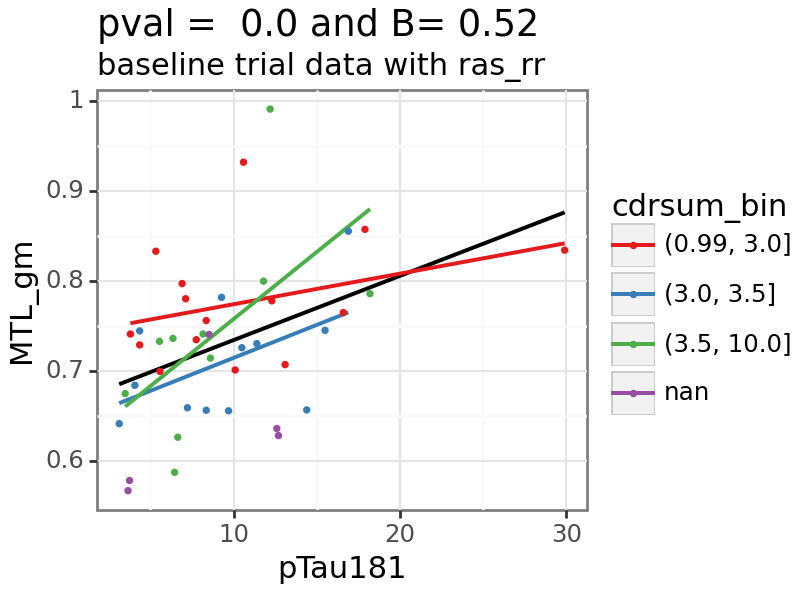

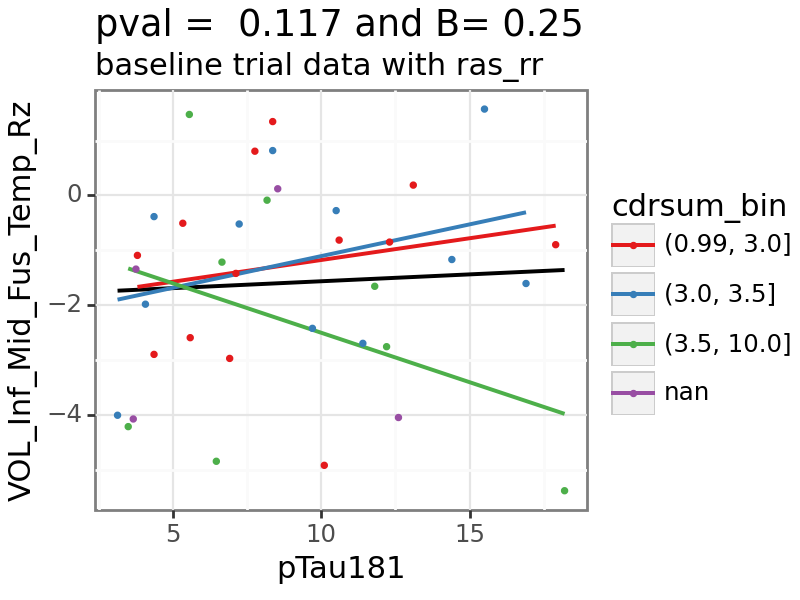

In [51]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('cdrsum_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'cdrsum_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## CDR 

C:\Users\Lauren.Koenig\AppData\Local\Temp\4\ipykernel_46816\1599349144.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


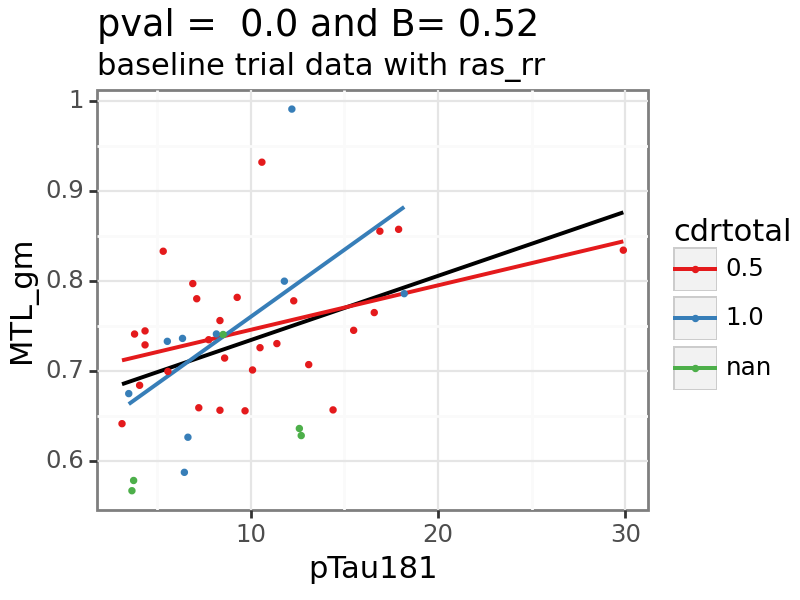

C:\Users\Lauren.Koenig\AppData\Local\Temp\4\ipykernel_46816\1599349144.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


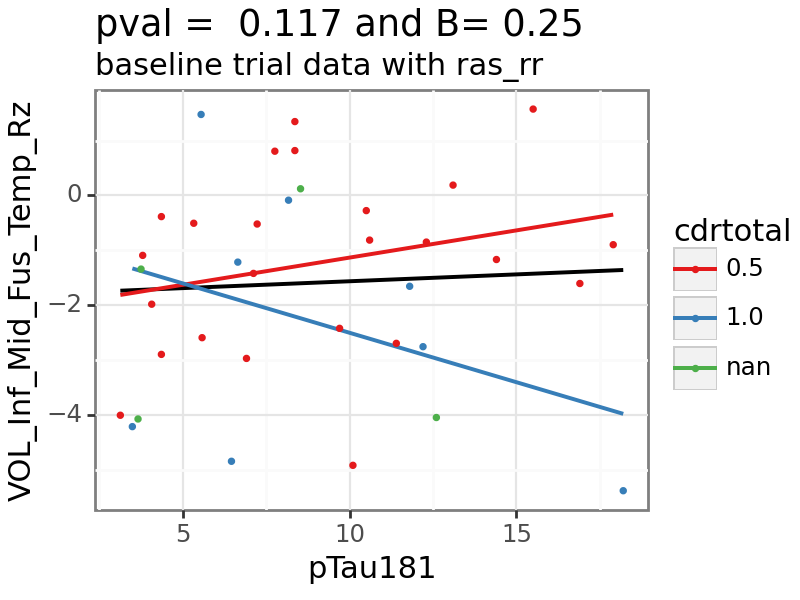

In [52]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data['cdrtotal'] = subset_data['cdrtotal'].astype('str')
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('cdrtotal', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'cdrtotal'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## MMSE

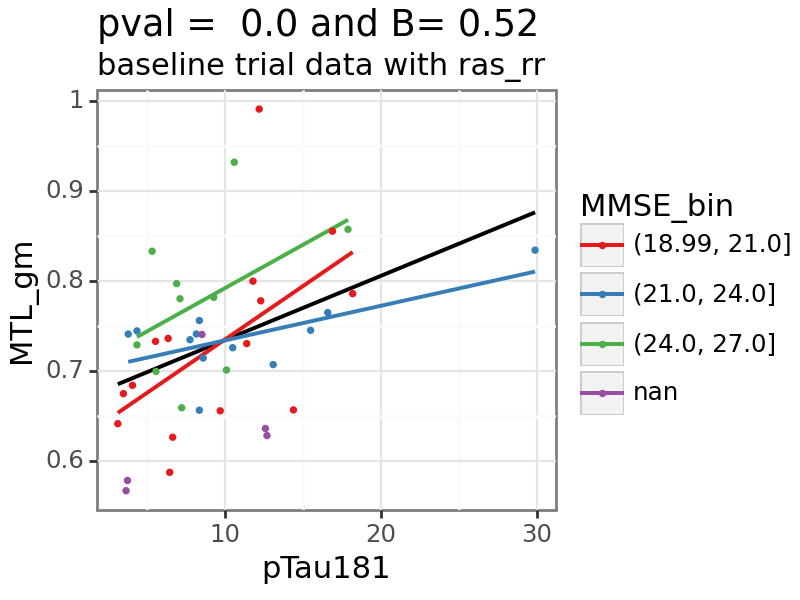

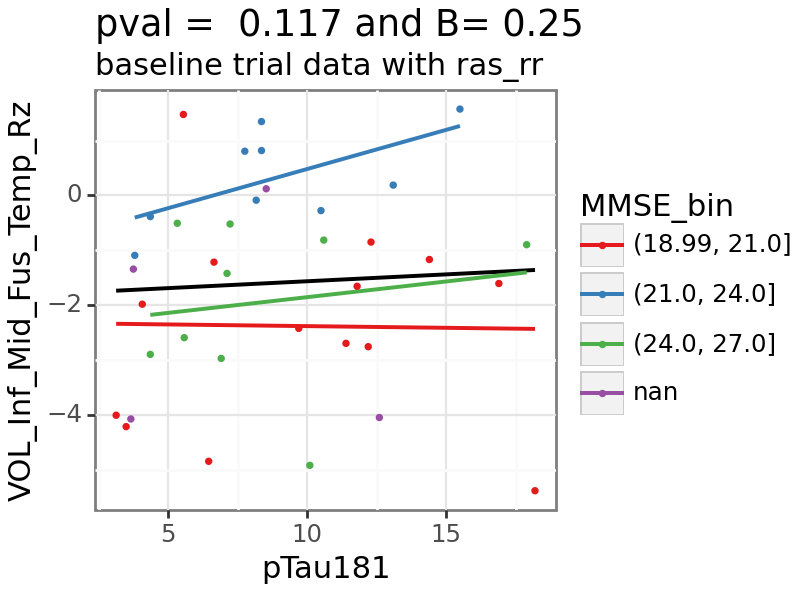

In [53]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('MMSE_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'MMSE_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Ab42/40 

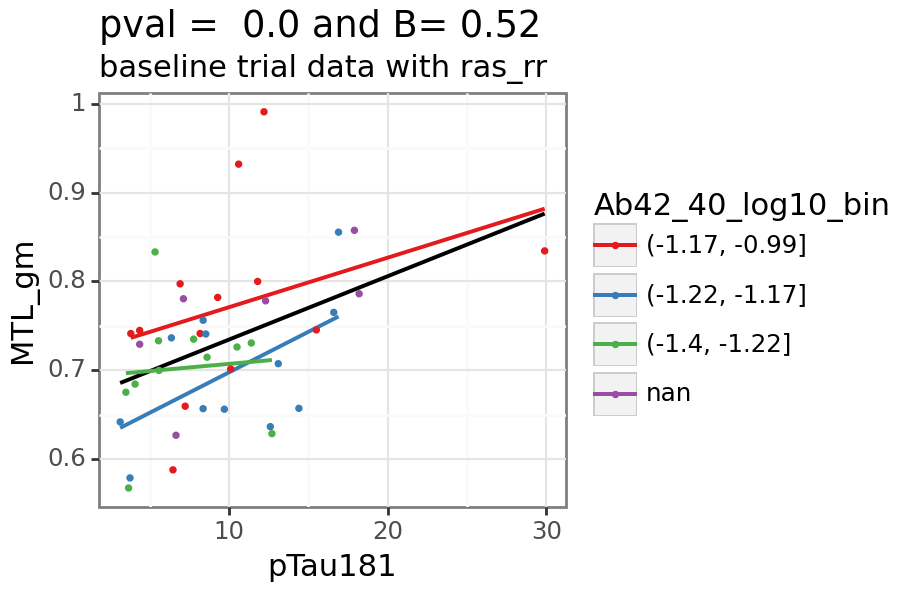

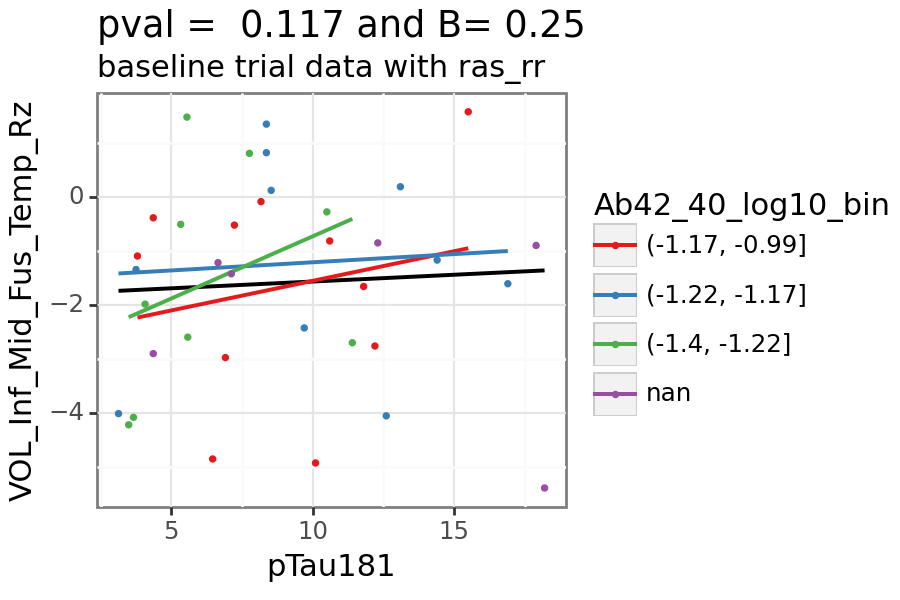

In [54]:
var = 'pTau181'
p9.options.figure_size = (4.5,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('Ab42_40_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'Ab42_40_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## pTau217

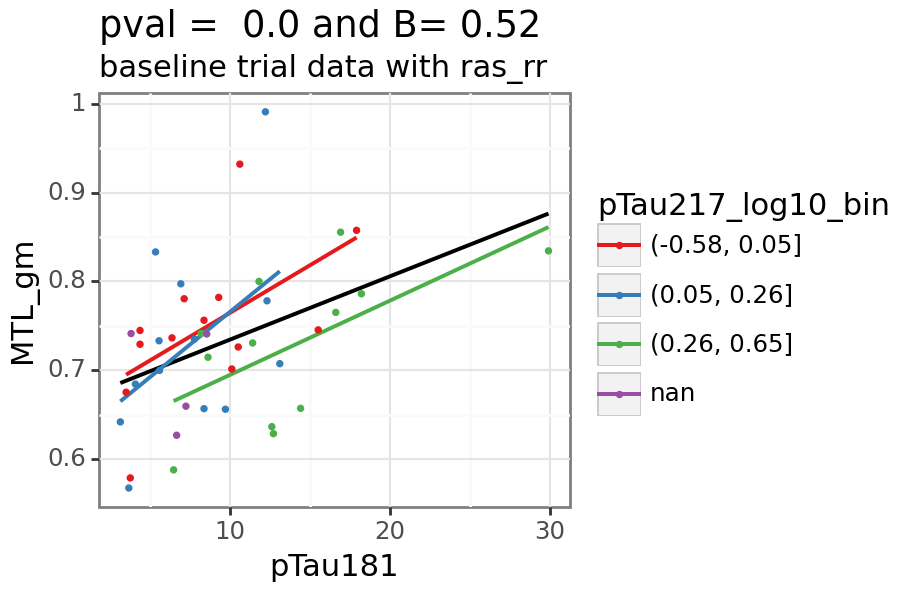

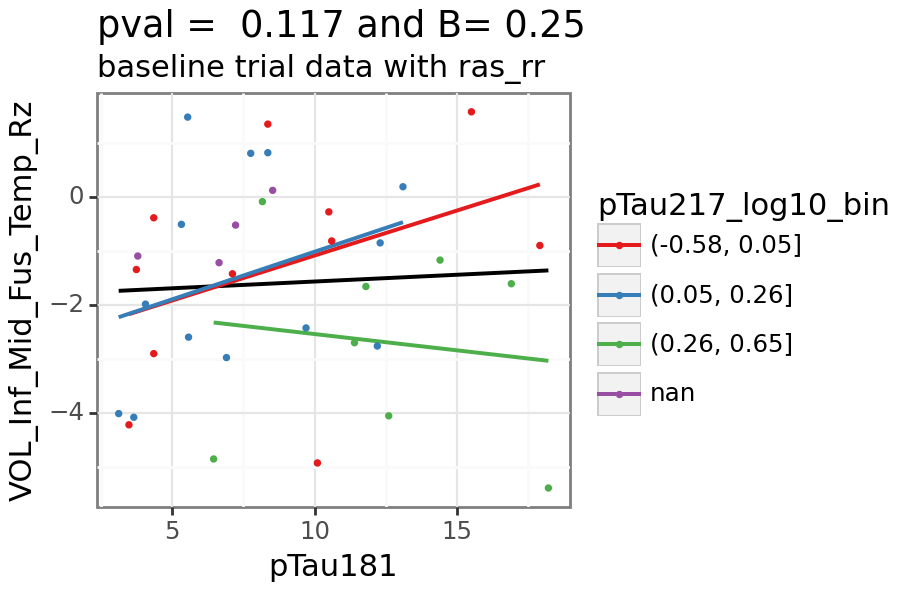

In [55]:
var = 'pTau181'
p9.options.figure_size = (4.5,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('pTau217_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'pTau217_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## GFAP

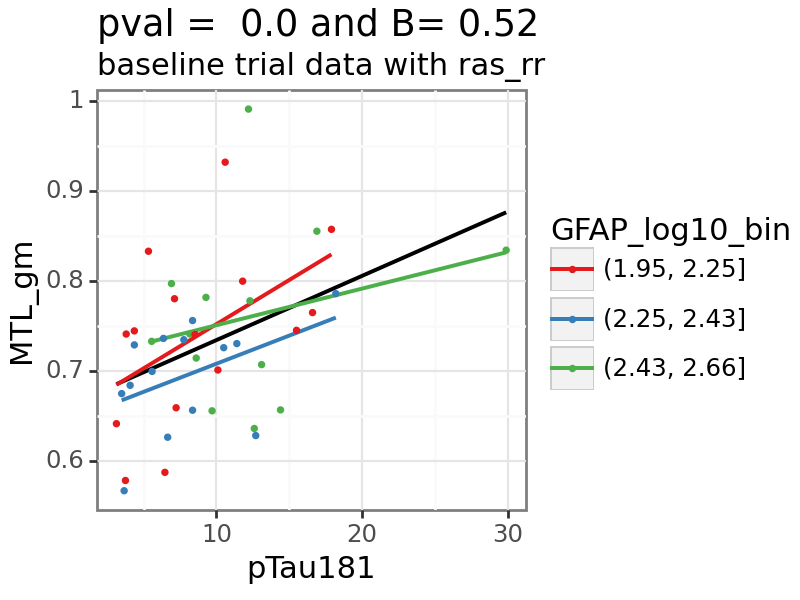

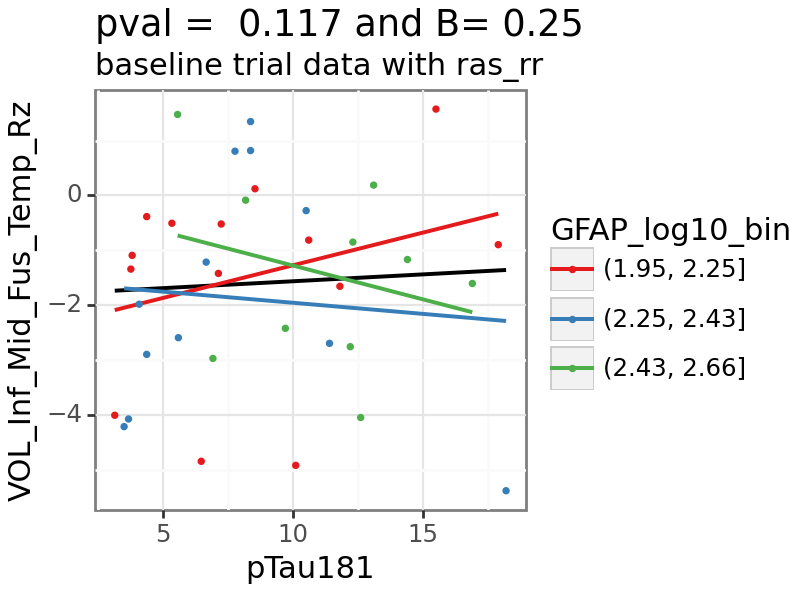

In [56]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('GFAP_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'GFAP_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## NFL

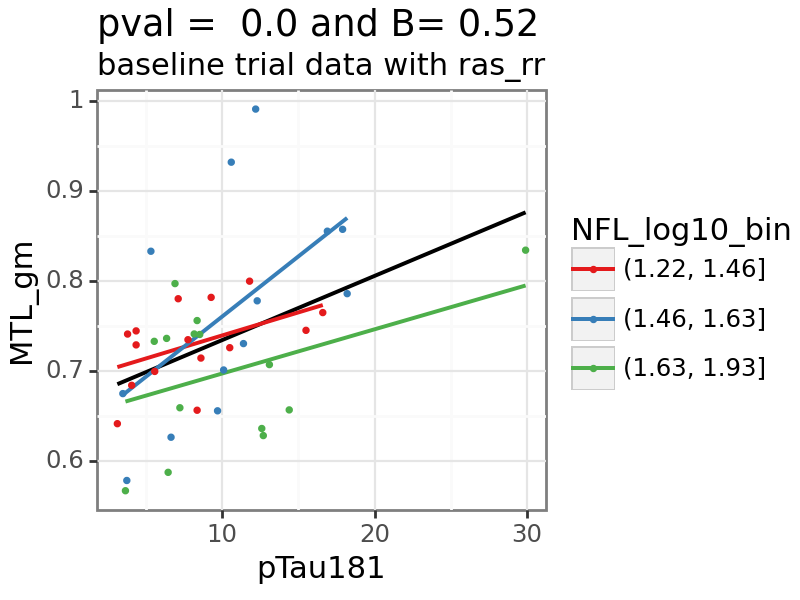

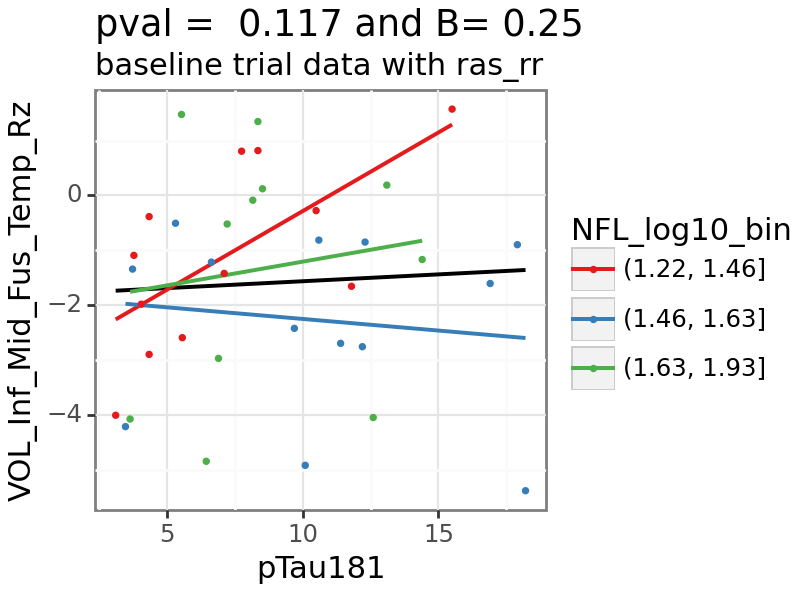

In [57]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('NFL_log10_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'NFL_log10_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

## Hip Vol

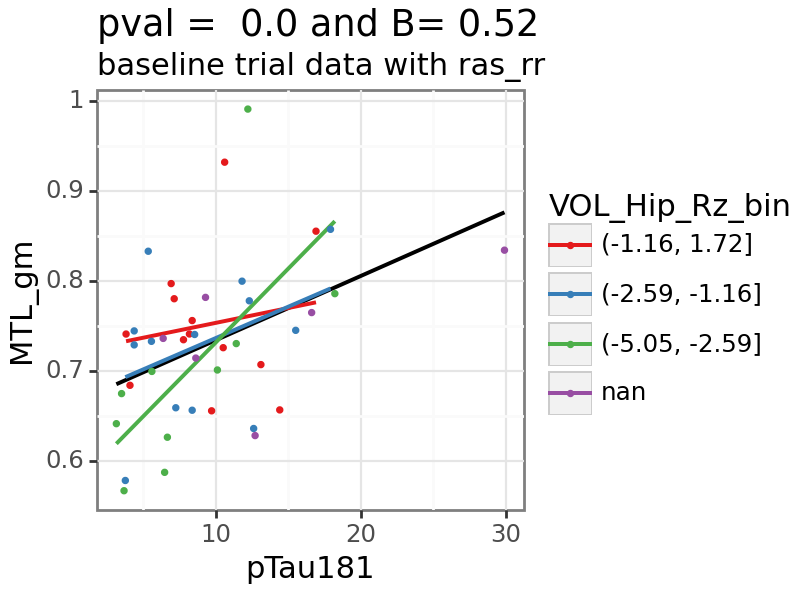

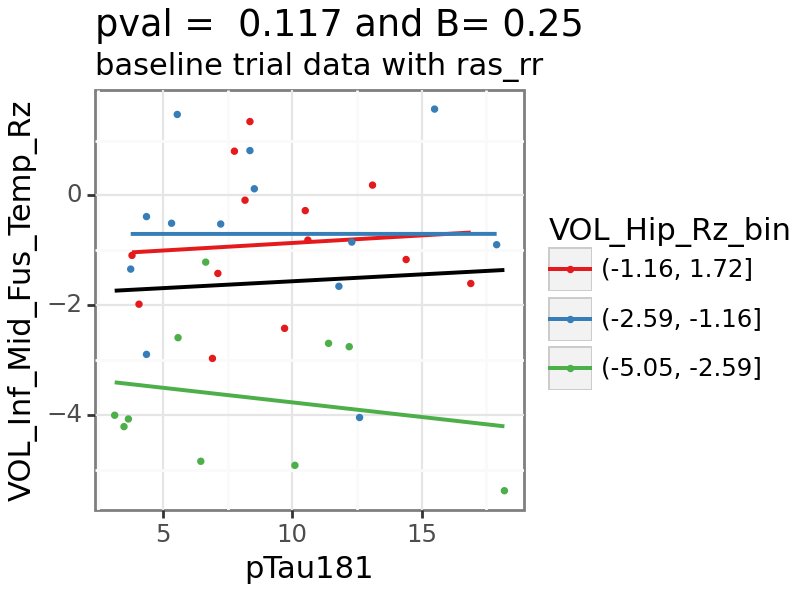

In [58]:
var = 'pTau181'
p9.options.figure_size = (4,3)  

for var1 in[ele for ele in ['Avg_Hip', 'MTL_gm', 'VOL_Inf_Mid_Fus_Temp_Rz'] if ele in all_data.columns]:
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('VOL_Hip_Rz_bin', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 6)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'VOL_Hip_Rz_bin'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# Plot 181 & 231 with separate age decade lines

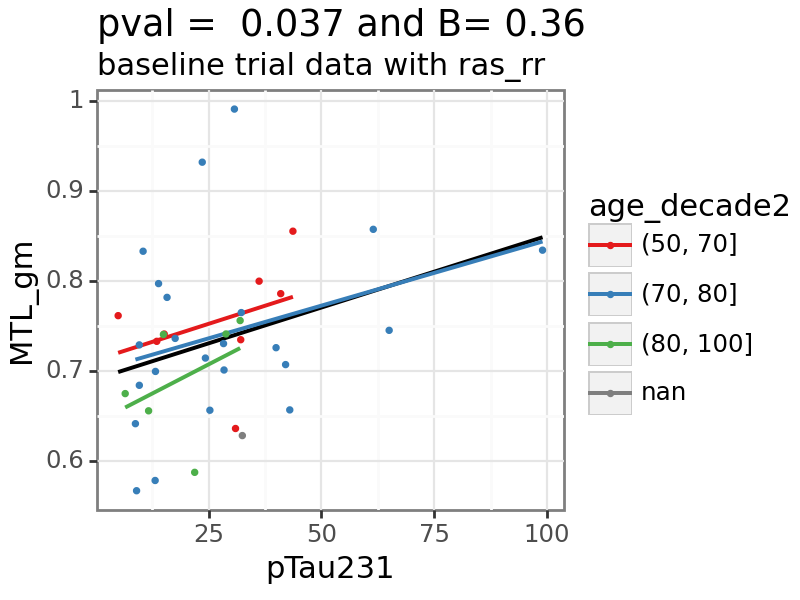

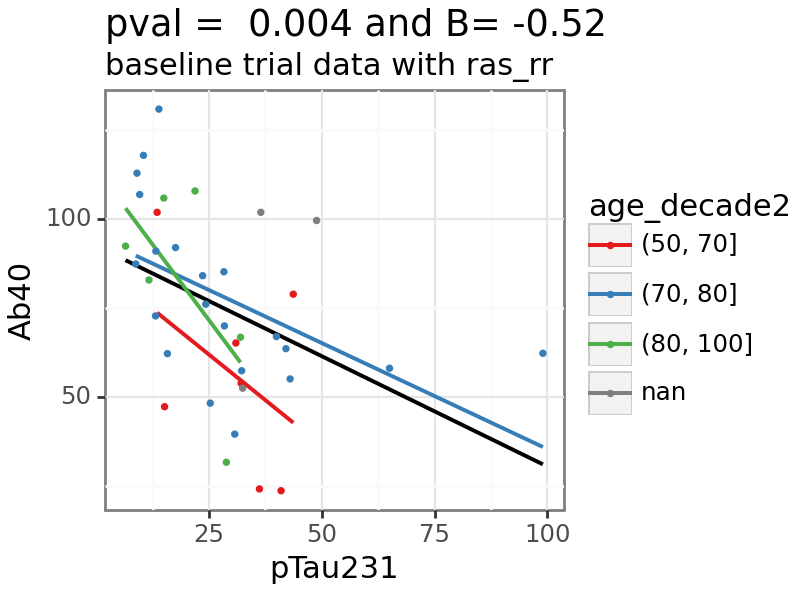

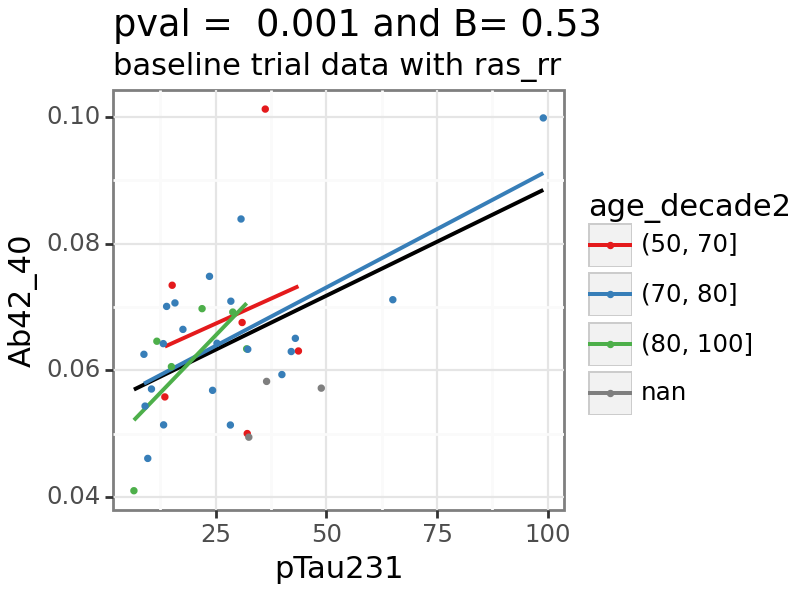

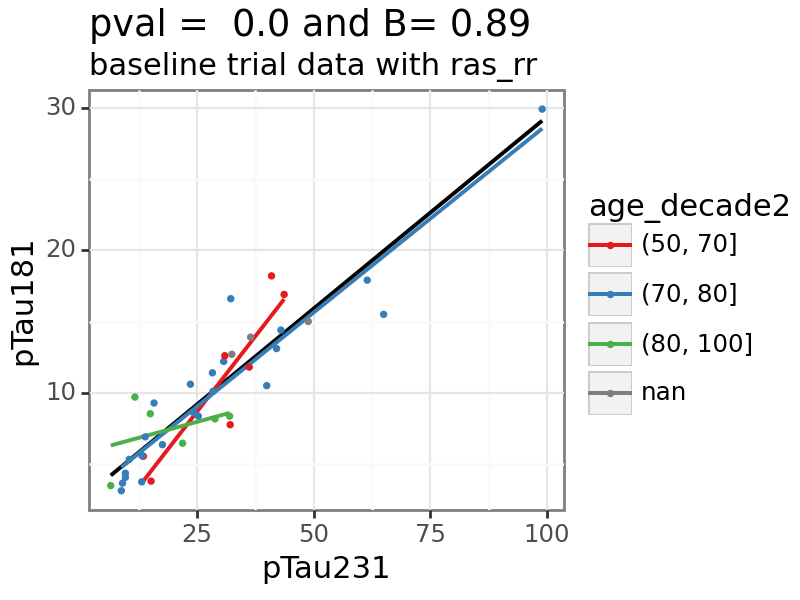

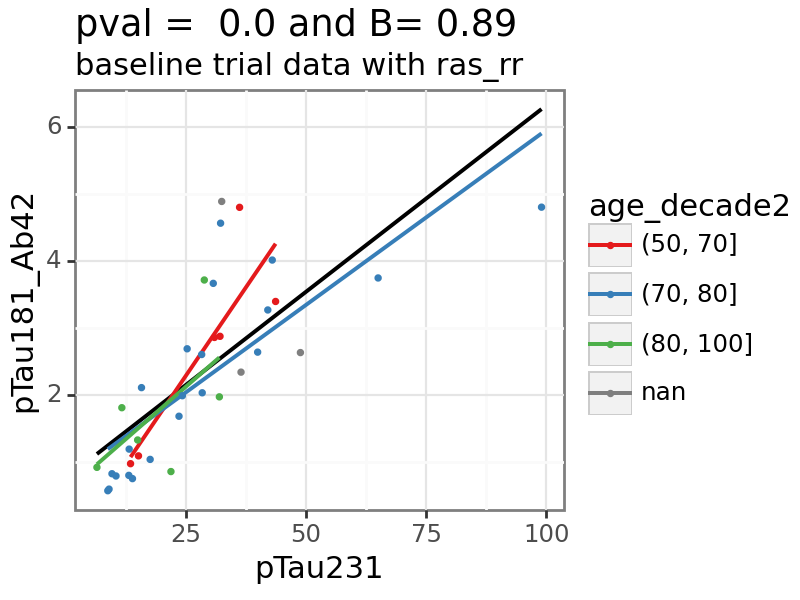

...

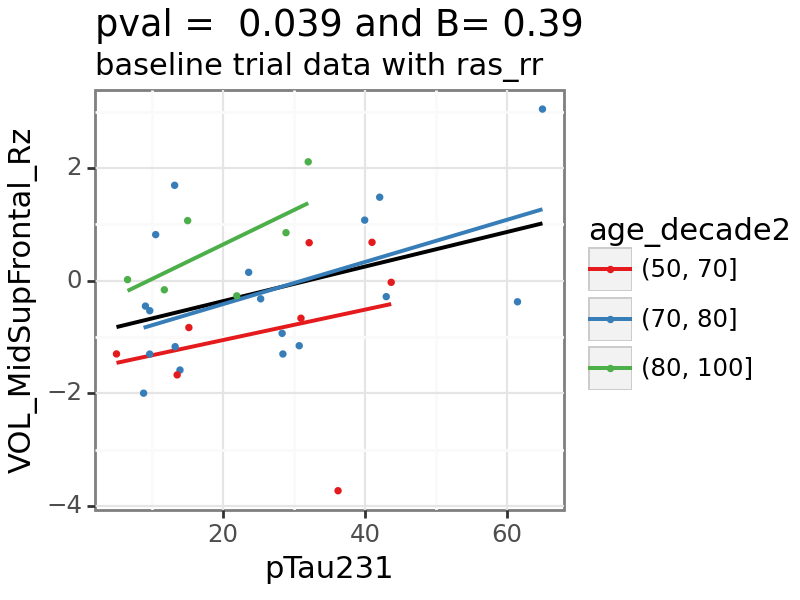

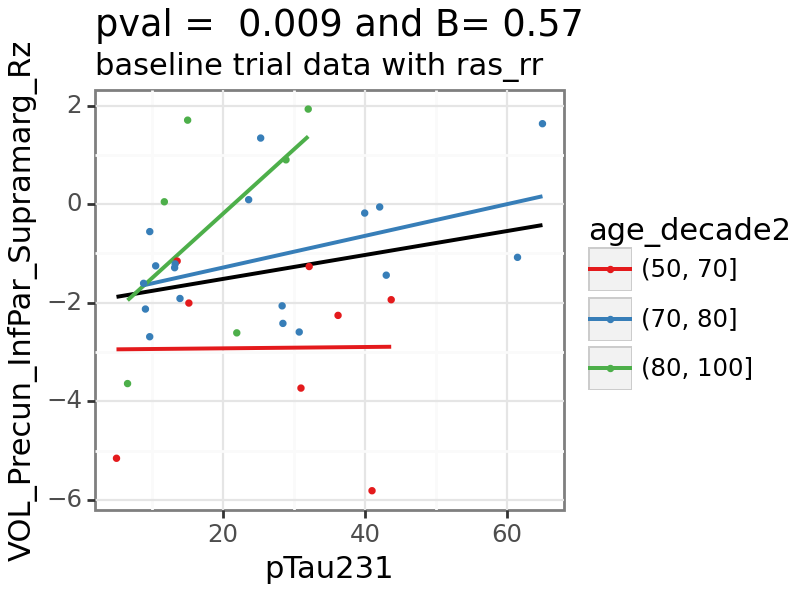

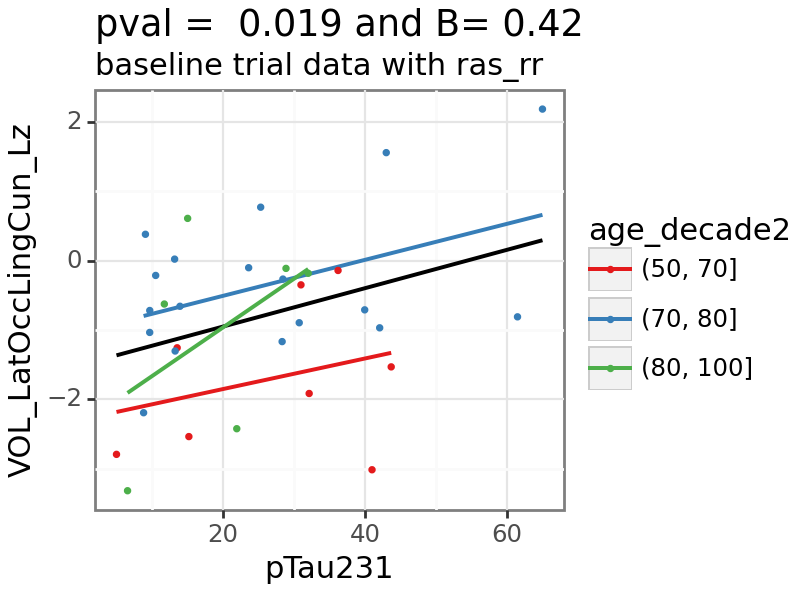

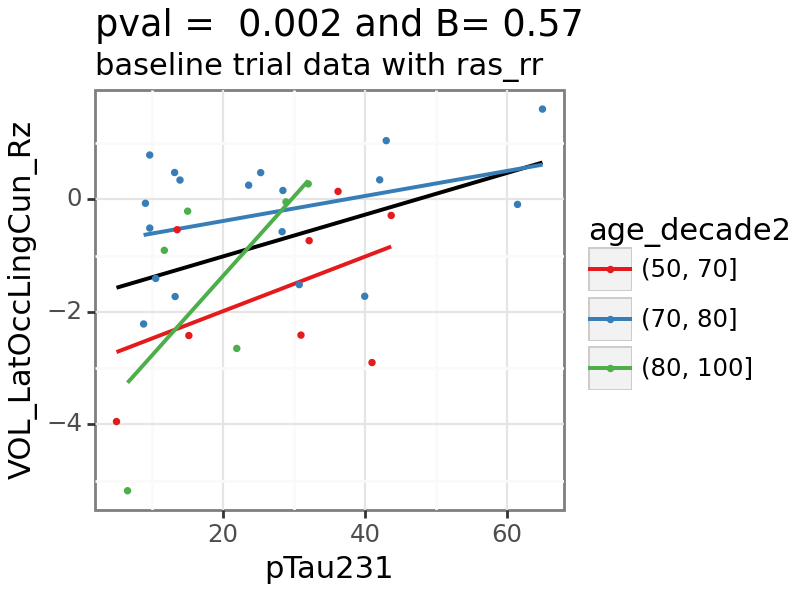

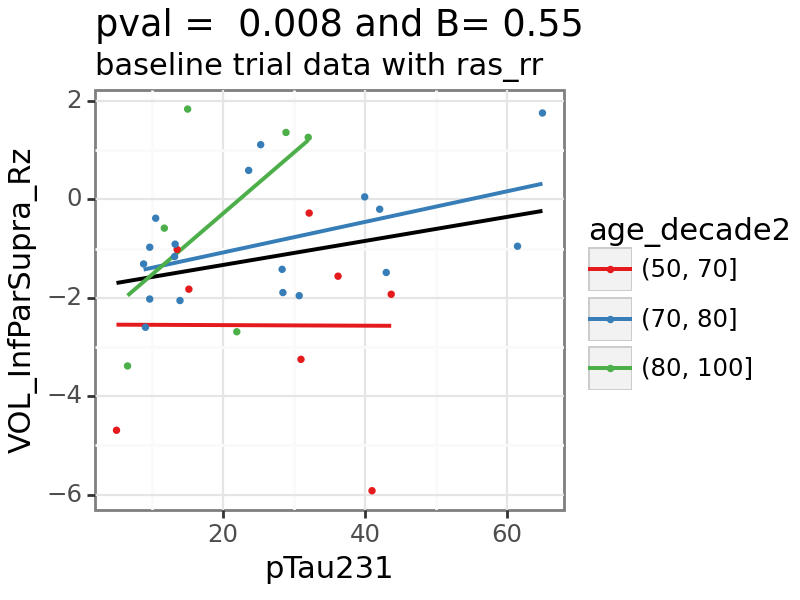

In [59]:
var = 'pTau231'
p9.options.figure_size = (4,3)  
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[selected_p_column].min(axis = 1)<graphing_pval), 
    'var2']

var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10['mv_age_p_baseline']<0.05), 
    'var2'] 

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 4)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

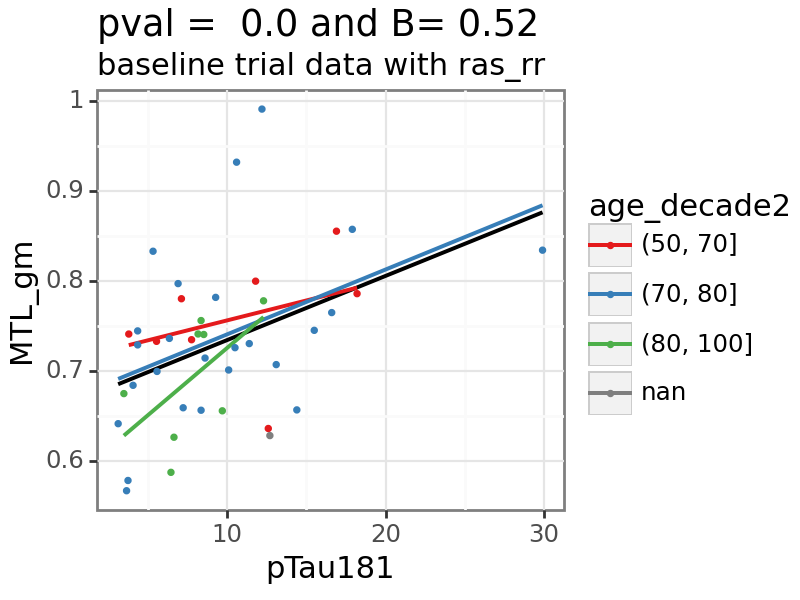

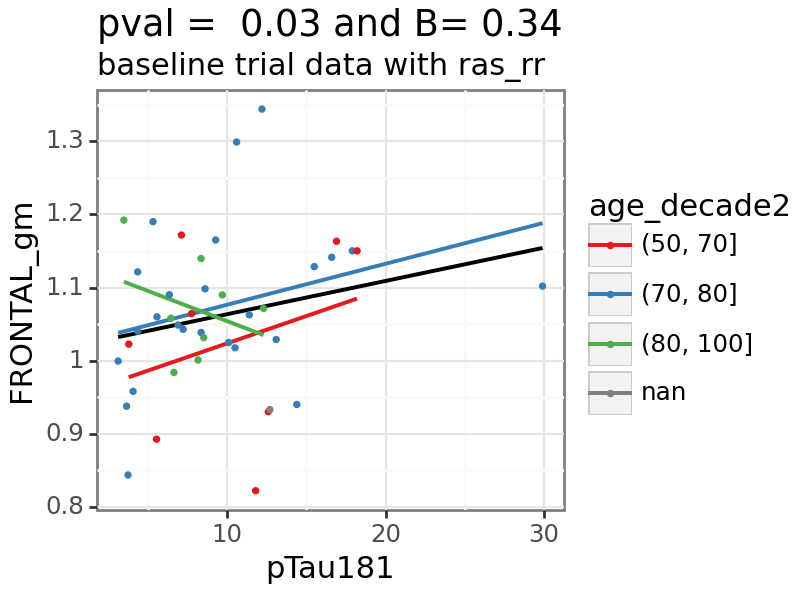

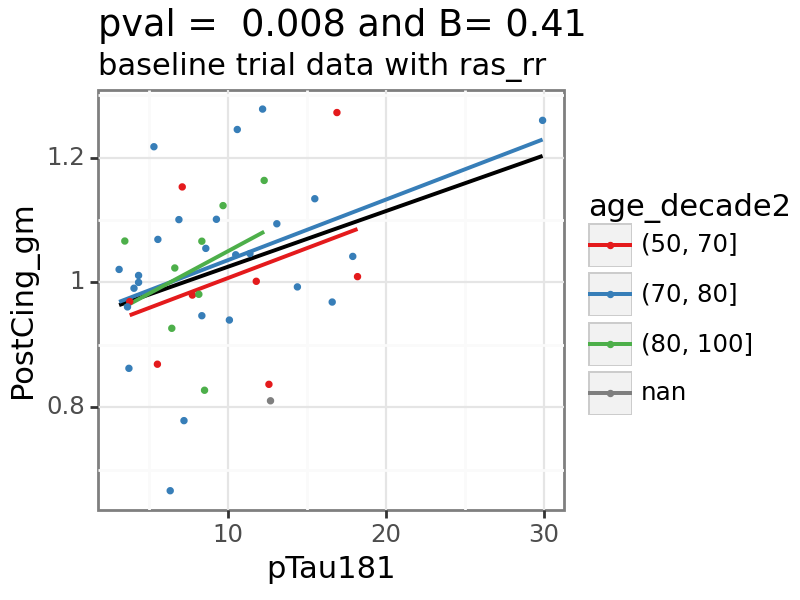

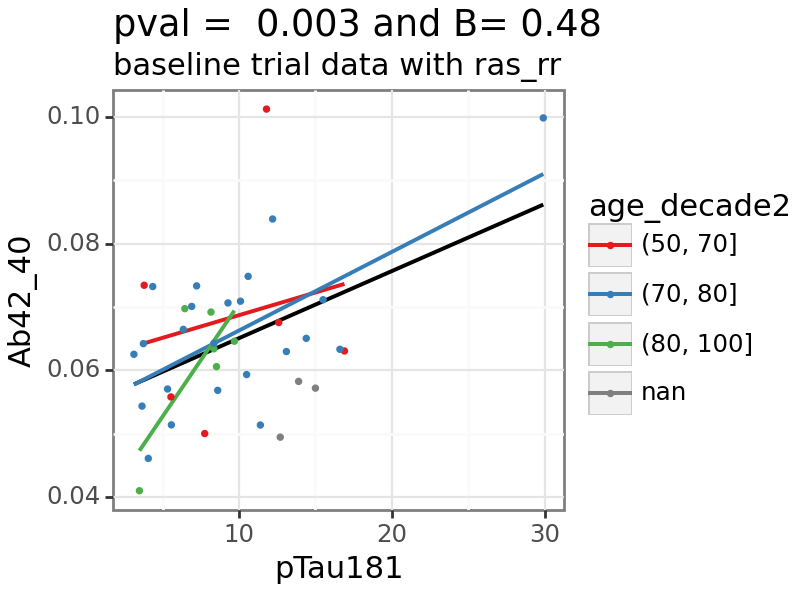

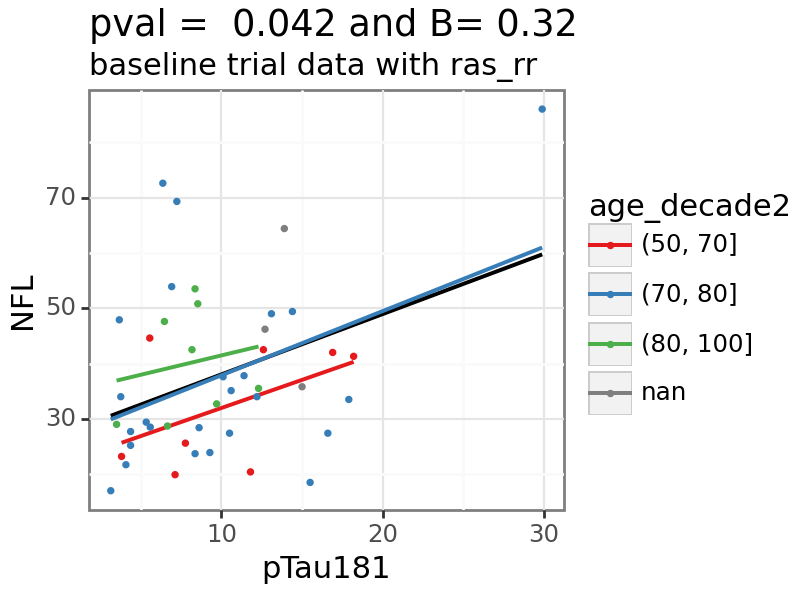

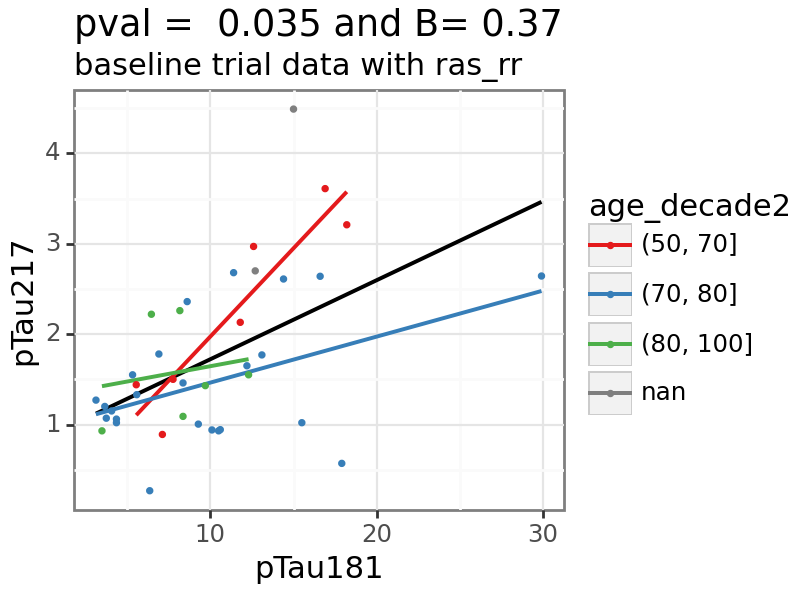

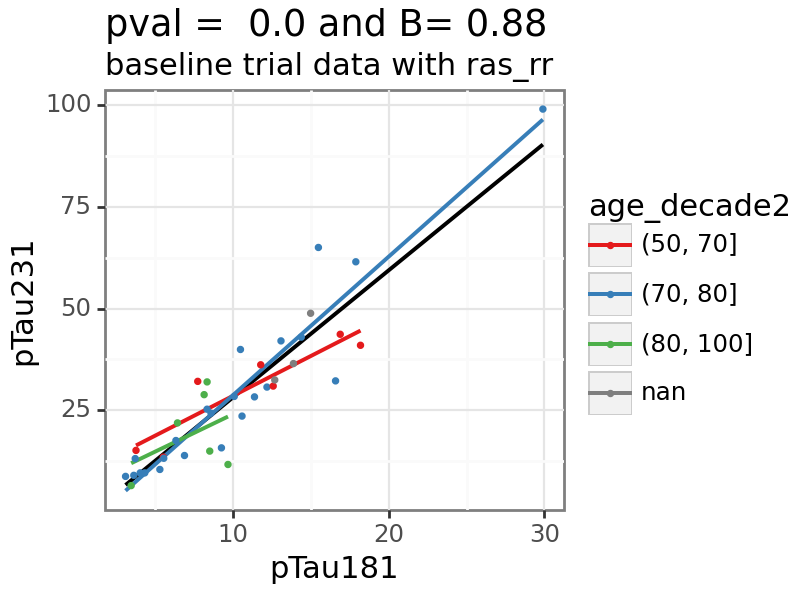

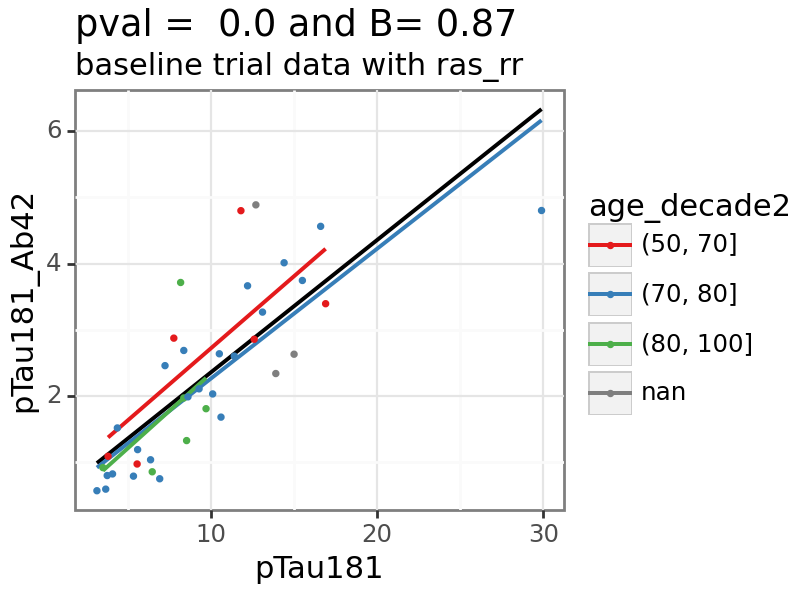

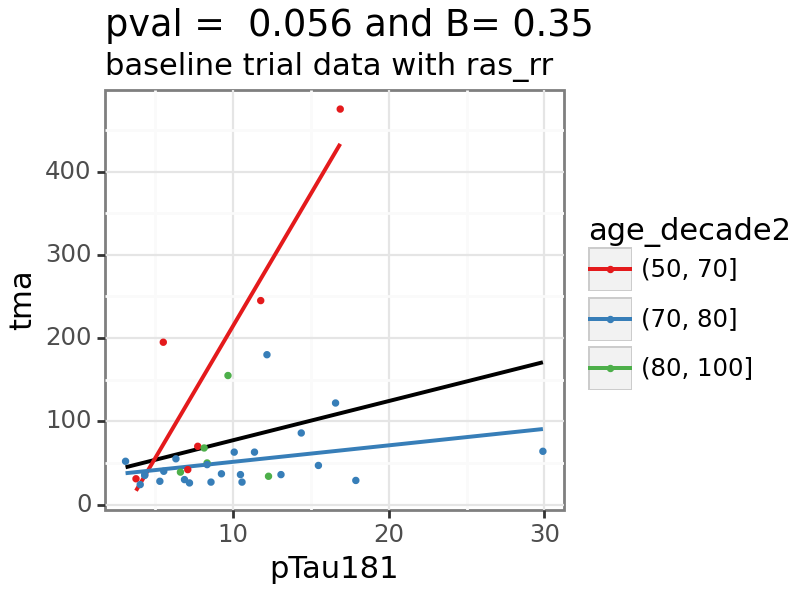

In [60]:
var = 'pTau181'
p9.options.figure_size = (4,3)  
var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10[selected_p_column].min(axis = 1)<graphing_pval), 
    'var2']

var_list = biomarker_relationship_results_log10.loc[
    biomarker_relationship_results_log10['var1'].isin([var]) & (biomarker_relationship_results_log10['mv_age_p_baseline']<0.05), 
    'var2'] 

for var1 in var_list.to_list():
    p_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), pvals_to_consider[0]].reset_index(drop=True)[0].round(3).astype('str')
    B_value = biomarker_relationship_results_log10.loc[biomarker_relationship_results_log10['var1'].isin([var]) & biomarker_relationship_results_log10['var2'].isin([var1]), Bval_to_grab].reset_index(drop=True)[0].round(2).astype('str')

    var0 = var
    subset_data = baseline_trial_data.dropna(subset = [var0, var1])
    subset_data2 = subset_data.copy()
    subset_data2 = subset_data2.groupby('age_decade2', observed=True).filter(lambda x: x['ID_ADM'].nunique()> 5)
    plot = (
            p9.ggplot(subset_data, p9.aes(x = var0, y = var1, color = 'age_decade2'))
            + p9.theme_bw(base_size = 11)
            + p9.geom_smooth(subset_data, size = 0.8, se = False, alpha = 1, color = 'black', method = 'lm')
            + p9.geom_smooth(subset_data2, size = 0.8, se = False, alpha = 1, method = 'lm')
            
            + p9.geom_point(size = 0.5)
            + p9.labs(title = ('pval =  ' + p_value + ' and B= ' + B_value), subtitle = 'baseline trial data with ' + data_name)
            + p9.scale_color_brewer(type='qual', palette='Set1')
        )
    print(plot)

# new

In [61]:
for var in  [ele for ele in FDG_columns if ele in all_data.columns]:

        
        temp_df_baseline =  baseline_trial_data.copy().dropna(subset = [var])

        # z-score data
        temp_df_baseline[ [var] + plasma_columns] = preprocessing.StandardScaler().fit_transform(temp_df_baseline[[var] + plasma_columns])

        model = smf.ols(formula = var + ' ~ Ab40 + Ab42 + Ab42_40 + GFAP + NFL + pTau181 + pTau217 + pTau231' , data = temp_df_baseline).fit()
        print(var, model.summary(), '\n')

Graycer_gm                             OLS Regression Results                            
Dep. Variable:             Graycer_gm   R-squared:                       0.256
Model:                            OLS   Adj. R-squared:                 -0.057
Method:                 Least Squares   F-statistic:                    0.8173
Date:                Tue, 10 Dec 2024   Prob (F-statistic):              0.597
Time:                        11:48:03   Log-Likelihood:                -36.114
No. Observations:                  28   AIC:                             90.23
Df Residuals:                      19   BIC:                             102.2
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0329      0.367      0.0

c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\statsmodels\regression\linear_model.py:1781: RuntimeWarning: invalid value encountered in scalar divide
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\statsmodels\regression\linear_model.py:1870: RuntimeWarning: invalid value encountered in scalar divide
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\statsmodels\regression\linear_model.py:956: RuntimeWarning: divide by zero encountered in log
c:\Users\Lauren.Koenig\AppData\Local\anaconda3\envs\Lauren\lib\site-packages\statsmodels\stats\stattools.py:50: RuntimeWarning: invalid value encountered in scalar divide


Temp_gm                             OLS Regression Results                            
Dep. Variable:                Temp_gm   R-squared:                       0.346
Model:                            OLS   Adj. R-squared:                  0.119
Method:                 Least Squares   F-statistic:                     1.522
Date:                Tue, 10 Dec 2024   Prob (F-statistic):              0.204
Time:                        11:48:04   Log-Likelihood:                -41.361
No. Observations:                  32   AIC:                             100.7
Df Residuals:                      23   BIC:                             113.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.1712      0.304      0.563 